# Creation of masks to separate the 12 patches of the sky

What this code does:

- creation of 12 masks for the 12 patches of the sky (HEALPix pixels Nside =1), apodise them with 3 different methods (smooth, C1, C2) then creation the 12 maps corresponding to the 12 masks
- check that we have 12 different PS for the 12 patches
- comparison of the power spectra for the different methods of apodisation: sharp mask (without apodisation) produces a power spectrum in temperature larger than the input one at large mutlipole l
- study of the influence of the apodisation factor, for values between 0.5 and 4.5°: minimum 1° necessary to avoid the PS being too high at large l (small apodisation looks like sharp)
- (also solves a problem I had (which is now solved) by doing the same study with a Planck mask covering the galactic plane (with the masks given on PLA, and by doing them myself))

In [1]:
import healpy as hp
import numpy as np
import matplotlib.pyplot as plt
import math
import pandas as pd
import time
import pymaster as nmt
from scipy.stats import binned_statistic

import warnings
warnings.filterwarnings("ignore")

In [2]:
Nside = 512
map = np.arange(hp.nside2npix(Nside))
#hp.mollview(map, nest=True, title="Mollview image NESTED")

mask = np.zeros(len(map))

for j in range(1,12+1):
    for i in range((j-1)*int(len(map)/12),j*int(len(map)/12)):
        mask[i] = j

#hp.mollview(mask, nest=True, title="Masks")

### Creation of the masks for each 12 part of the map

Masks with sharp edges:

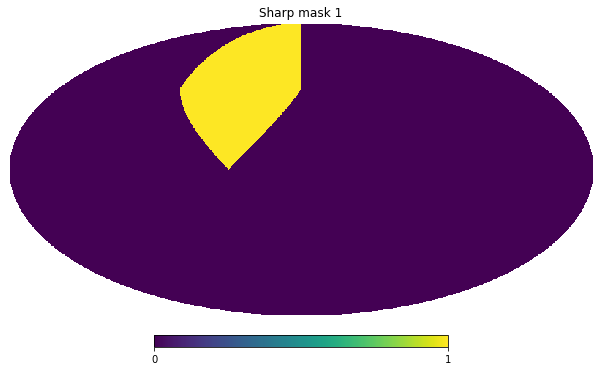

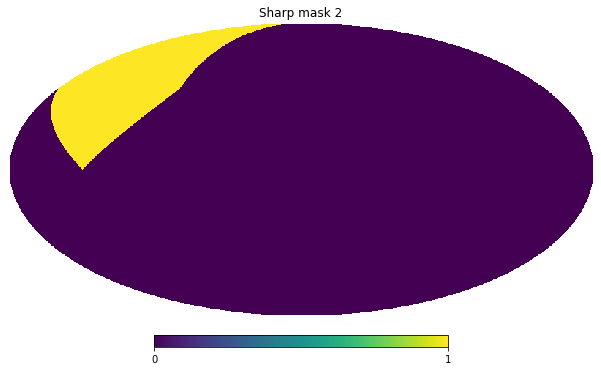

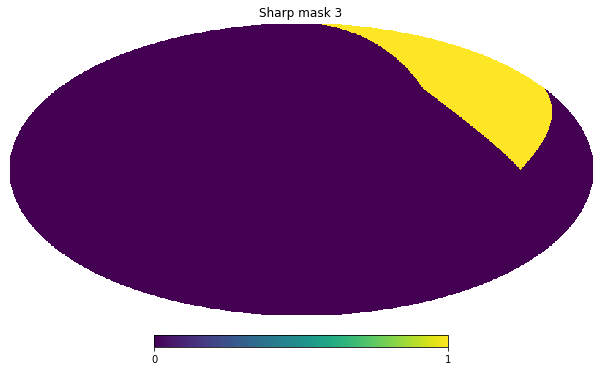

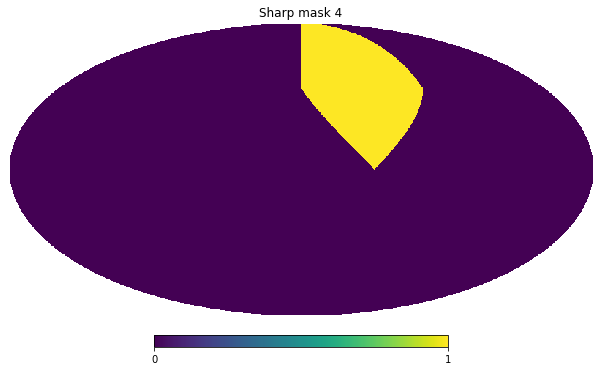

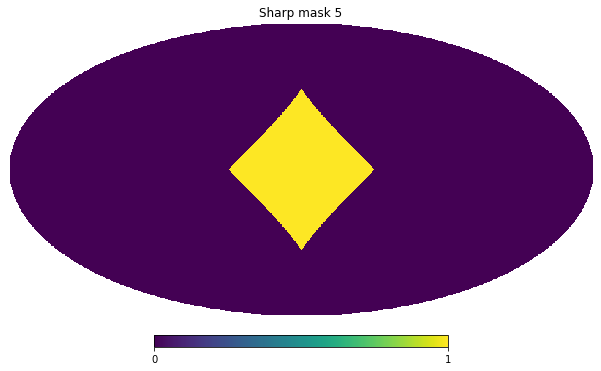

...

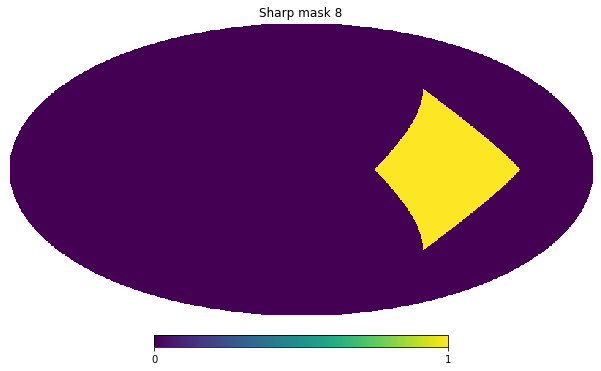

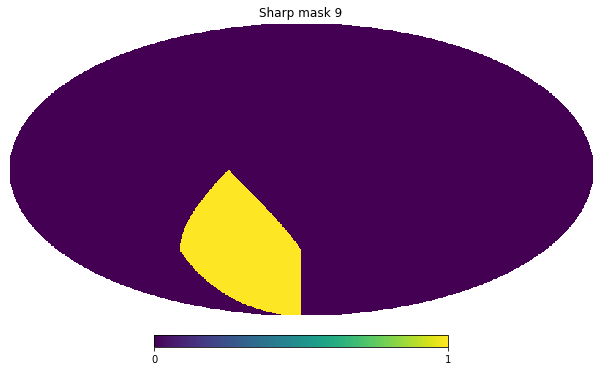

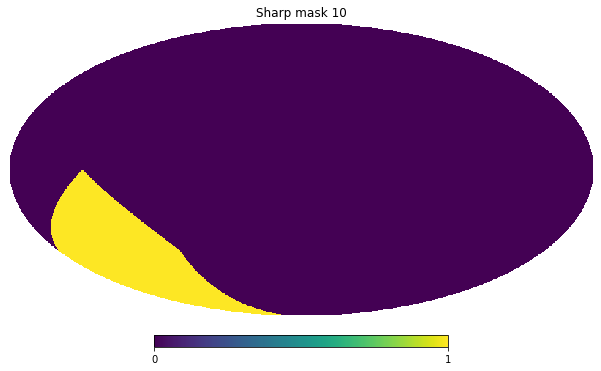

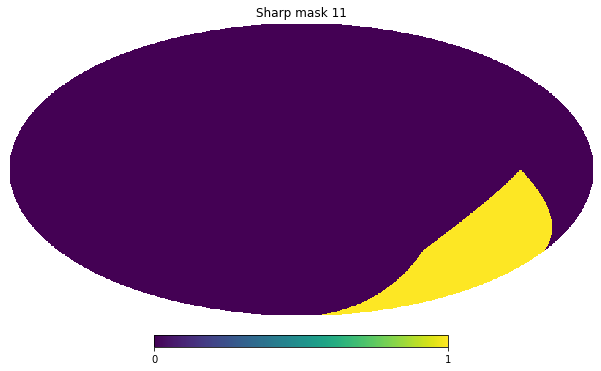

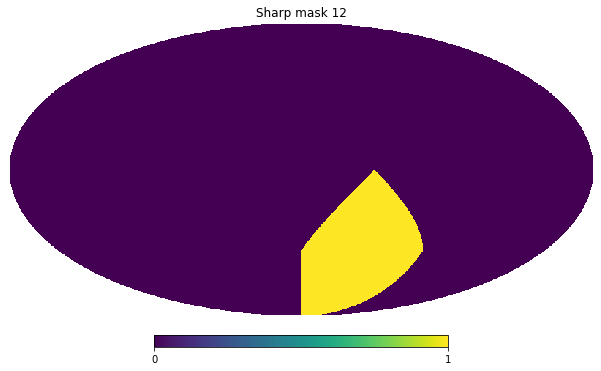

In [3]:
sharp_masks = []

for j in range(1,13):                                          # For the 12 patches of the sky,
    mask = np.zeros(len(map))                                  # we construct a map with only zeros,
    for i in range((j-1)*int(len(map)/12),j*int(len(map)/12)): # select the place where there will be the mask,
        mask[i] = 1                                            # then add the value 1 where there is the mask.
    hp.mollview(mask, nest=True, title="Sharp mask %s"%j)
    sharp_masks.append(mask)

Masks with round edges:

In order to smooth the edges, we first need to save the masks in the nest format:

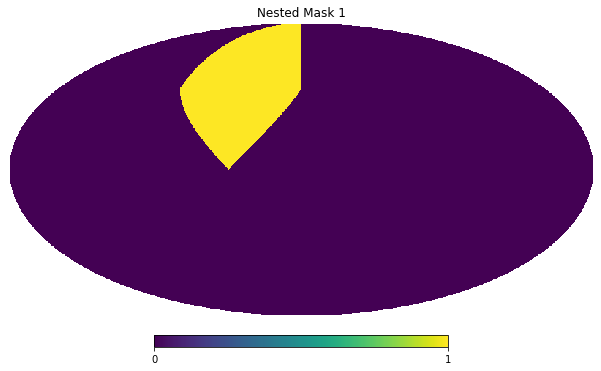

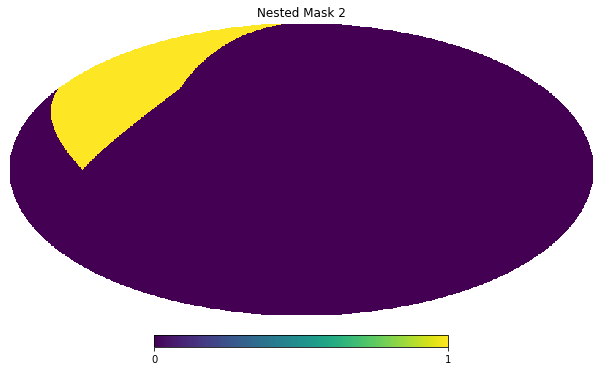

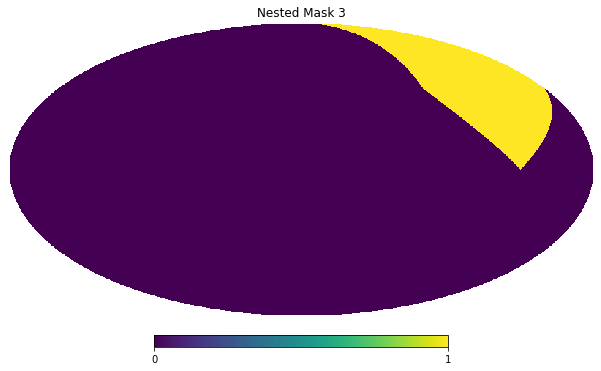

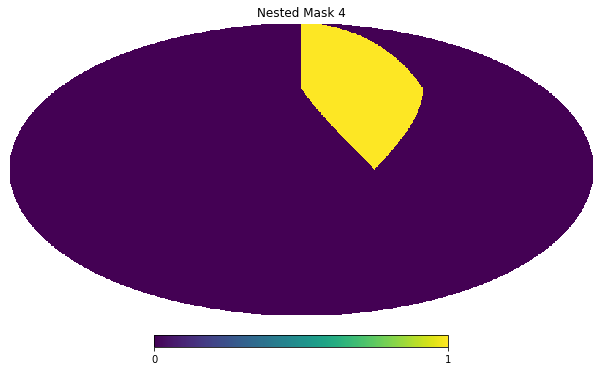

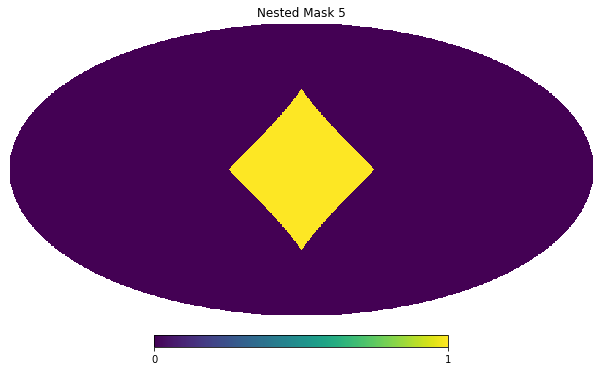

...

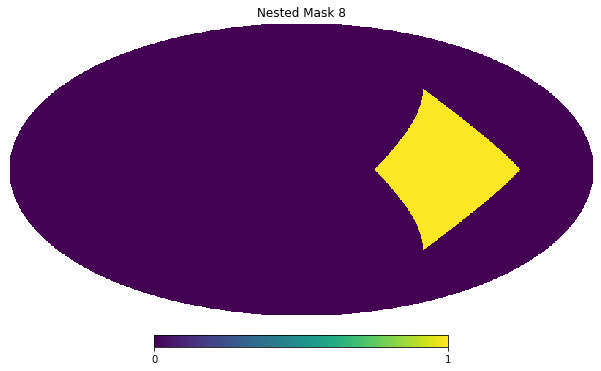

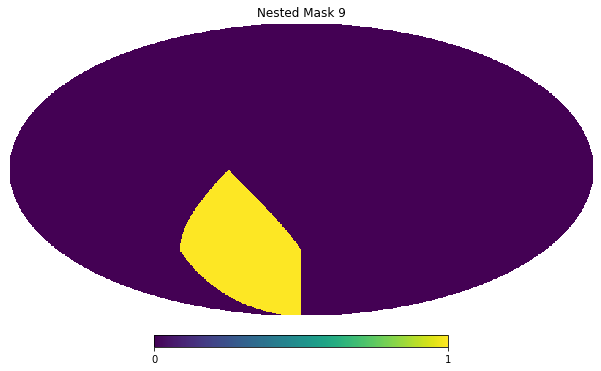

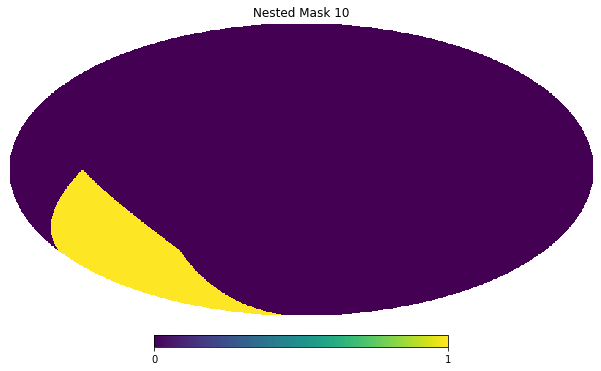

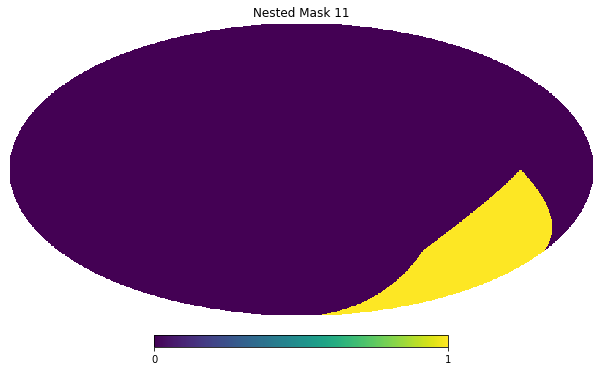

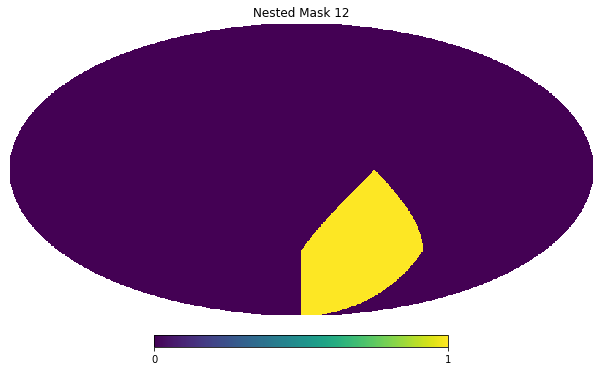

In [4]:
nested_masks = []
for i in range(len(sharp_masks)):                         # For each one of the masks,
    nested_masks.append(np.zeros(len(sharp_masks[0])))    # we create a new map of zeros.

for i in range(len(nested_masks)):                        # Then, for each one of them,
    new_place = hp.pixelfunc.ring2nest(Nside, np.arange(len(sharp_masks[0]))) # we calculate the new position of the pixels for the nested format
    for j in range(len(new_place)):
        nested_masks[i][j] = sharp_masks[i][new_place[j]] # and add the values of the mask for the new format.
    hp.mollview(nested_masks[i], title='Nested Mask %s'%(i+1))

Now, it is possible to smooth the edges:

33.95275716781616 min


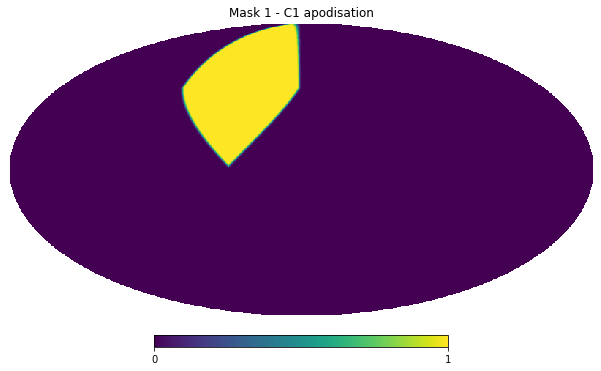

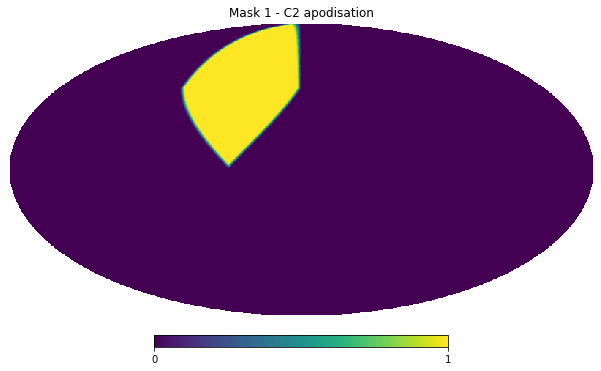

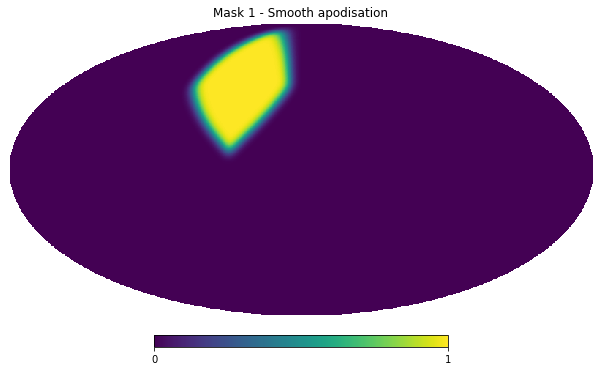

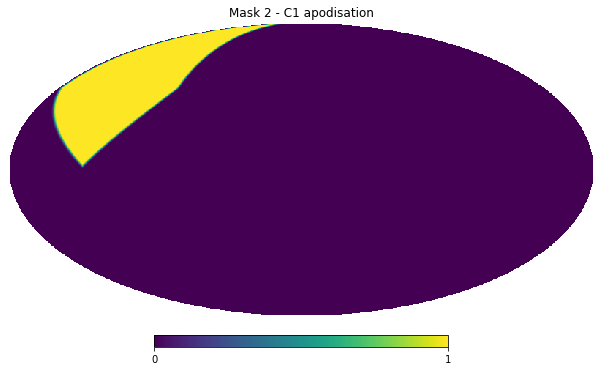

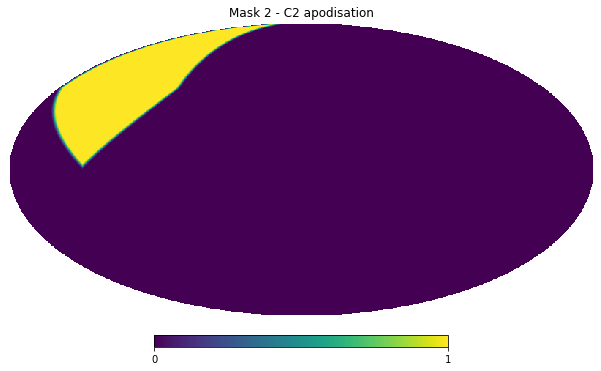

...

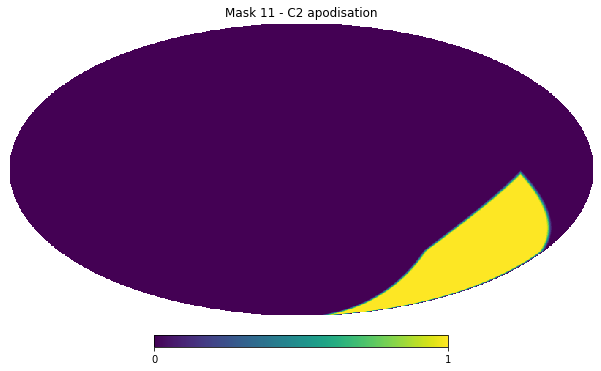

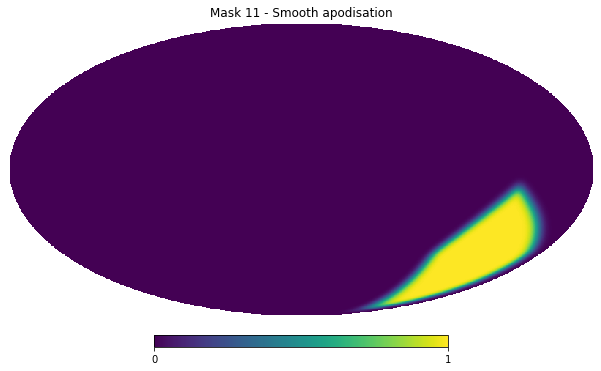

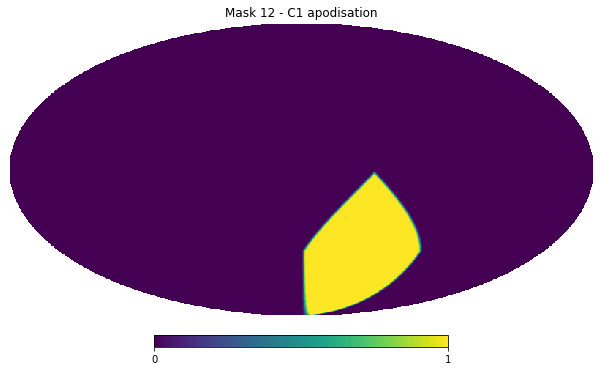

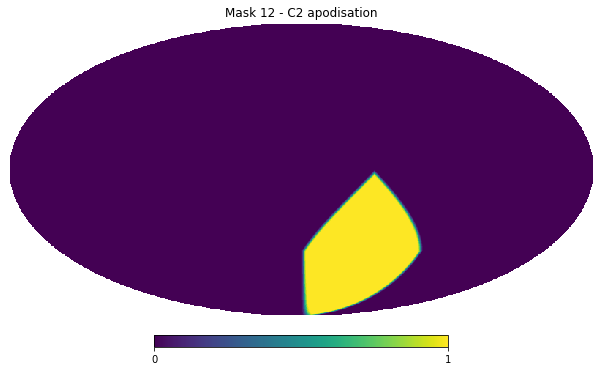

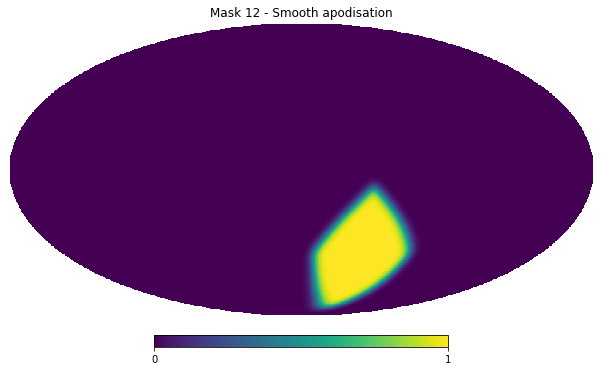

In [45]:
"""aposcale = 2.5 # apodisation scale in degree

masks_Sm = []  # 3 different
masks_C1 = []  # methods
masks_C2 = []  # of apodisation

start_time = time.time()

for i in range(len(nested_masks)):
    mask_raw = nested_masks[i]

    mask_Sm = nmt.mask_apodization(mask_raw, aposcale, apotype="Smooth")
    masks_Sm.append(mask_Sm)
    mask_C1 = nmt.mask_apodization(mask_raw, aposcale, apotype="C1")
    masks_C1.append(mask_C1)
    mask_C2 = nmt.mask_apodization(mask_raw, aposcale, apotype="C2")
    masks_C2.append(mask_C2)
        
    hp.mollview(mask_C1, title='Mask %s - C1 apodisation'%(i+1))
    hp.mollview(mask_C2, title='Mask %s - C2 apodisation'%(i+1))
    hp.mollview(mask_Sm, title='Mask %s - Smooth apodisation'%(i+1))
    
print((time.time() - start_time)/60, "min") """

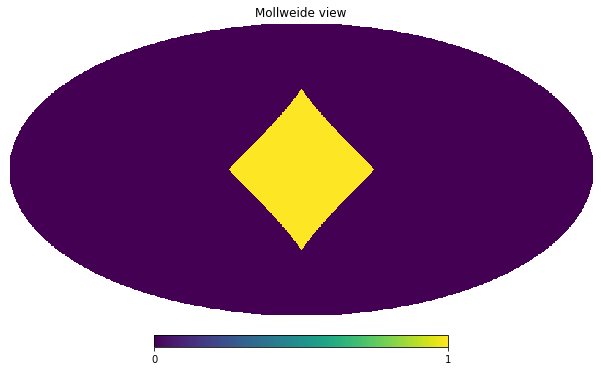

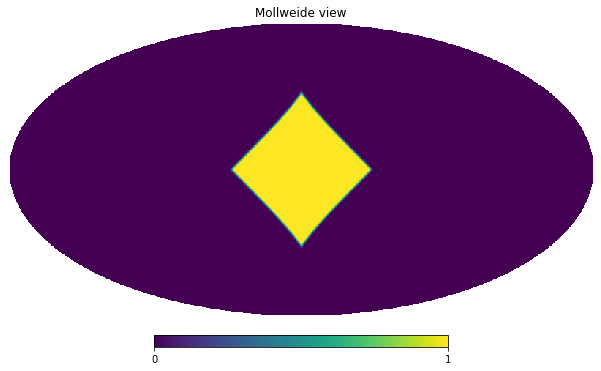

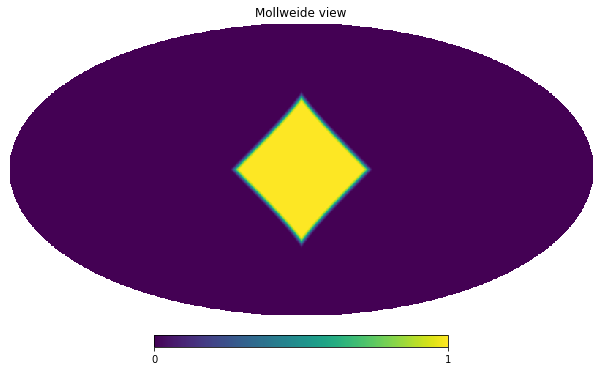

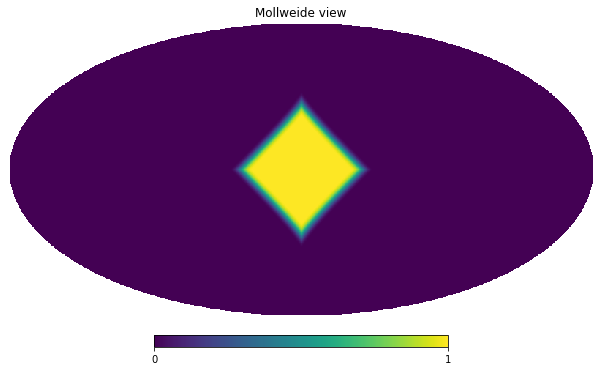

In [7]:
# Test of different apodization scales

aposcale = 0
mask_0_apo = nmt.mask_apodization(nested_masks[4], aposcale, apotype="C1")
hp.mollview(mask_0_apo, title='Mask with 0° apodization')

aposcale = 2.5
mask_2_5_apo = nmt.mask_apodization(nested_masks[4], aposcale, apotype="C1")
hp.mollview(mask_2_5_apo, title='Mask with 2.5° apodization')

aposcale = 5
mask_5_apo = nmt.mask_apodization(nested_masks[4], aposcale, apotype="C1")
hp.mollview(mask_5_apo, title='Mask with 5° apodization')

aposcale = 10
mask_10_apo = nmt.mask_apodization(nested_masks[4], aposcale, apotype="C1")
hp.mollview(mask_10_apo, title='Mask with 10° apodization')

In [ ]:
# save the masks
#for i in range(len(masks_Sm)):
#    hp.write_map('./Masks/Mask%s_apoSm'%i, masks_Sm[i])
#    hp.write_map('./Masks/Mask%s_apoC1'%i, masks_C1[i])
#    hp.write_map('./Masks/Mask%s_apoC2'%i, masks_C2[i])

In [8]:
masks_Sm = []
masks_C1 = []
masks_C2 = []

for i in range(12):
    masks_Sm.append(hp.read_map('./Masks/Mask%s_apoSm'%i))
    masks_C1.append(hp.read_map('./Masks/Mask%s_apoC1'%i))
    masks_C2.append(hp.read_map('./Masks/Mask%s_apoC2'%i))

smooth_masks = masks_Sm
C1_apod_masks = masks_C1
C2_apod_masks = masks_C2

In [9]:
non_zero_Sm = smooth_masks[0][np.where(smooth_masks[0] != 0.0)]
#print('Number of pixels that have been changed for the smooth apodisation: ',
#      len(non_zero_Sm[np.where(non_zero_Sm != 1.0)]))
print('Ratio of pixels that have been changed for the smooth apodisation: ',
      len(non_zero_Sm[np.where(non_zero_Sm != 1.0)])/len(smooth_masks[0])*100, '%')

non_zero_C1 = C1_apod_masks[0][np.where(C1_apod_masks[0] != 0.0)]
#print('Number of pixels that have been changed for the C1 apodisation: ',
#      len(non_zero_C1[np.where(non_zero_C1 != 1.0)]))
print('Ratio of pixels that have been changed for the C1 apodisation: ',
      len(non_zero_C1[np.where(non_zero_C1 != 1.0)])/len(C1_apod_masks[0])*100, '%')

non_zero_C2 = C2_apod_masks[0][np.where(C2_apod_masks[0] != 0.0)]
#print('Number of pixels that have been changed for the C2 apodisation: ',
#      len(non_zero_C2[np.where(non_zero_C2 != 1.0)]))
print('Ratio of pixels that have been changed for the C2 apodisation: ',
      len(non_zero_C2[np.where(non_zero_C2 != 1.0)])/len(C2_apod_masks[0])*100, '%')


print('Ratio between smooth and C1/C2: ',
      len(non_zero_Sm[np.where(non_zero_Sm != 1.0)])/len(non_zero_C1[np.where(non_zero_C1 != 1.0)]))

Ratio of pixels that have been changed for the smooth apodisation:  7.273038228352864 %
Ratio of pixels that have been changed for the C1 apodisation:  1.210912068684896 %
Ratio of pixels that have been changed for the C2 apodisation:  1.212310791015625 %
Ratio between smooth and C1/C2:  6.006248031082642


### Creation of CMB maps, separated into 12 parts

In [9]:
PLA_best_PS = pd.read_csv("COM_PowerSpect_CMB-base-plikHM-TTTEEE-lowl-lowE-lensing-minimum-theory_R3.01_copie.txt", delim_whitespace=True, index_col=0) # taking the PLA power spectrum

max_size = False
if max_size : # high value of Nside
    nside = 1024
    lmax = PLA_best_PS.index[-1]
else :        # low value of Nside
    nside = 512
    lmax = 2 * nside -1

cl = PLA_best_PS.divide(PLA_best_PS.index * (PLA_best_PS.index+1) / (2*np.pi), axis="index")
cl /= 1e12 # in muK^2
cl = cl.reindex(np.arange(0, lmax+1)) # re index because it begins at 2
cl = cl.fillna(0) # replace the 1st values by 0 instead of NaN

seed = 583
np.random.seed(seed)

fwhm = 20 * np.pi / (60*180) # 20 arcmin in rad

In [10]:
alm = hp.synalm((cl.TT, cl.EE, cl.BB, cl.TE), lmax=lmax, new=True)        # creation of alm from cl
CMB_map = hp.alm2map(alm, nside=nside, lmax=lmax, pixwin=True, fwhm=fwhm) # returns a list of T,Q,U maps from alm

Creation of CMB maps with sharp masks:

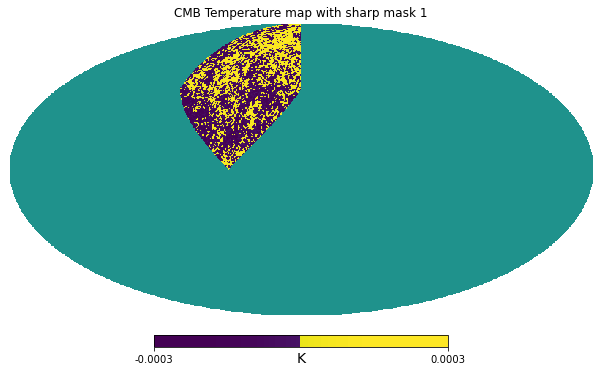

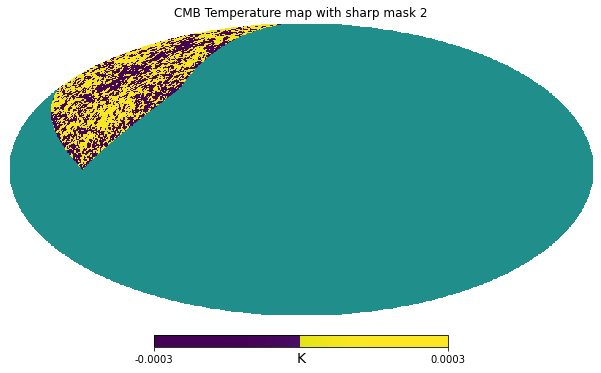

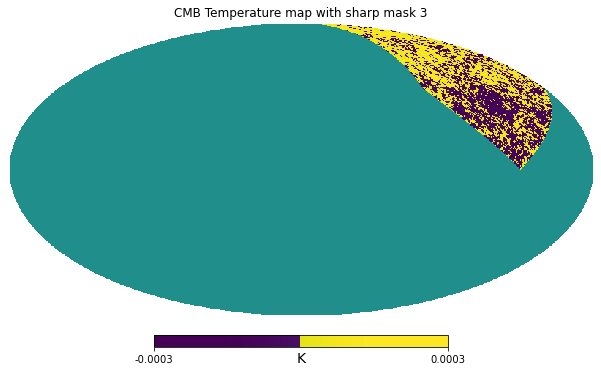

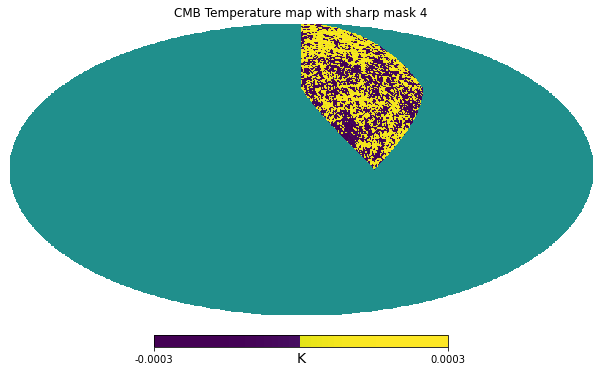

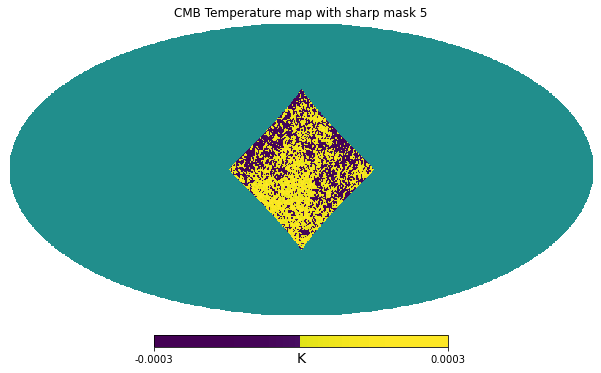

...

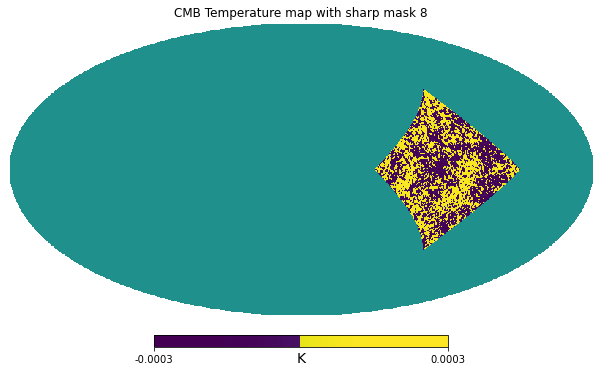

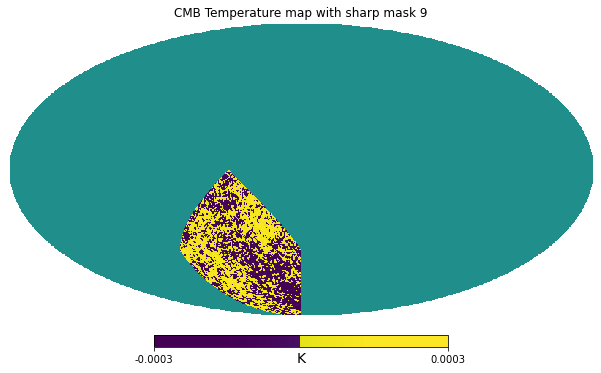

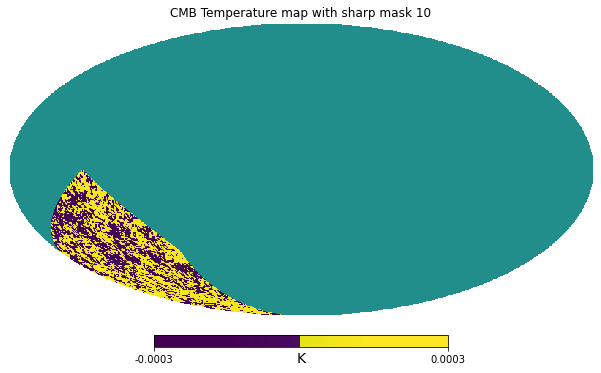

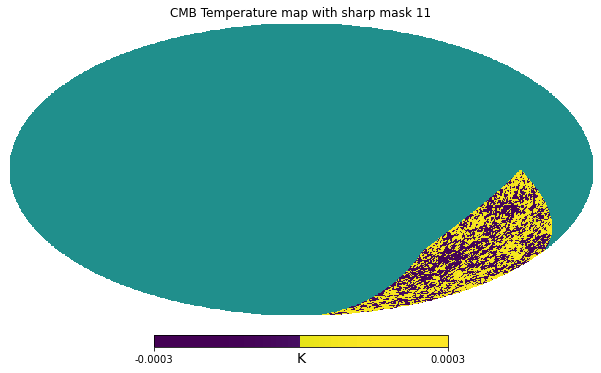

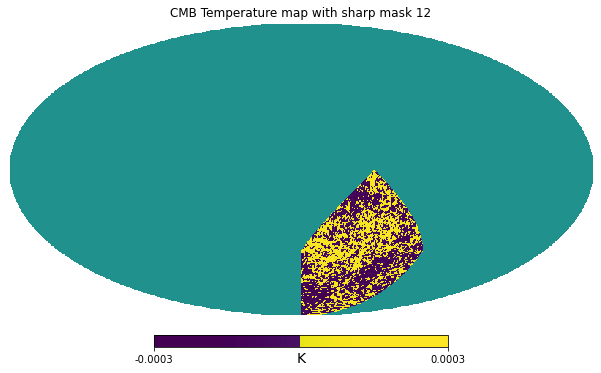

In [11]:
maps_with_sharp_mask = []

for mask in nested_masks:                # For each mask,
    new_map = []
    for i in range(len(CMB_map)):       # for the T, Q and U maps,
        new_map.append(CMB_map[i]*mask) # the mask is added to the map.
    maps_with_sharp_mask.append(new_map)

for i in range(len(maps_with_sharp_mask)): # 12 maps
    hp.mollview(maps_with_sharp_mask[i][0], norm='hist', min=-300*1e-6, max=300*1e-6, unit="K", nest=False, title="CMB Temperature map with sharp mask %s"%(i+1))
    #for m in maps_with_sharp_mask[i][1:]: # Q and U maps
        #hp.mollview(m, norm='hist', min=-30*1e-6, max=30*1e-6, unit="K", nest=False, title="CMB Polarization map with sharp mask %s"%(i+1))

Creation of CMB maps with smooth masks:

In [12]:
maps_with_smooth_mask = []

for mask in smooth_masks:               # For each mask,
    new_map = []
    for i in range(len(CMB_map)):       # for the T, Q and U maps,
        new_map.append(CMB_map[i]*mask) # the mask is added to the map.
    maps_with_smooth_mask.append(new_map)

#for i in range(len(maps_with_smooth_mask)): # 12 maps
    #hp.mollview(maps_with_smooth_mask[i][0], norm='hist', min=-300*1e-6, max=300*1e-6, unit="K", nest=False, title="CMB Temperature map with smooth mask %s"%(i+1))
    #for m in maps_with_smooth_mask[i][1:]: # Q and U maps
        #hp.mollview(m, norm='hist', min=-30*1e-6, max=30*1e-6, unit="K", nest=False, title="CMB Polarization map with smooth mask %s"%(i+1))

Creation of CMB maps with C1 apodisation masks:

In [13]:
maps_with_C1_mask = []

for mask in C1_apod_masks:              # For each mask,
    new_map = []
    for i in range(len(CMB_map)):       # for the T, Q and U maps,
        new_map.append(CMB_map[i]*mask) # the mask is added to the map.
    maps_with_C1_mask.append(new_map)

#for i in range(len(maps_with_C1_mask)): # 12 maps
    #hp.mollview(maps_with_C1_mask[i][0], norm='hist', min=-300*1e-6, max=300*1e-6, unit="K", nest=False, title="CMB Temperature map with smooth mask %s"%(i+1))
    #for m in maps_with_C1_mask[i][1:]: # Q and U maps
        #hp.mollview(m, norm='hist', min=-30*1e-6, max=30*1e-6, unit="K", nest=False, title="CMB Polarization map with smooth mask %s"%(i+1))

Creation of CMB maps with C2 apodisation masks:

In [14]:
maps_with_C2_mask = []

for mask in C2_apod_masks:              # For each mask,
    new_map = []
    for i in range(len(CMB_map)):       # for the T, Q and U maps,
        new_map.append(CMB_map[i]*mask) # the mask is added to the map.
    maps_with_C2_mask.append(new_map)

#for i in range(len(maps_with_C2_mask)): # 12 maps
    #hp.mollview(maps_with_C2_mask[i][0], norm='hist', min=-300*1e-6, max=300*1e-6, unit="K", nest=False, title="CMB Temperature map with smooth mask %s"%(i+1))
    #for m in maps_with_C2_mask[i][1:]: # Q and U maps
        #hp.mollview(m, norm='hist', min=-30*1e-6, max=30*1e-6, unit="K", nest=True, title="CMB Polarization map with smooth mask %s"%(i+1))

### Power spectra of the 12 different parts

In [15]:
PLA_PS = np.loadtxt("COM_PowerSpect_CMB-base-plikHM-TTTEEE-lowl-lowE-lensing-minimum-theory_R3.01.txt")

sigma = fwhm/2.35
f_sky = 1/12 # fraction of the covered sky (mask)

In [16]:
Dls = []
y_subtraction = []

non_zero_C1 = C1_apod_masks[0][np.where(C1_apod_masks[0] != 0.0)]
sum_C1 = 0
for i in non_zero_C1:
    sum_C1 += i
f_sky_C1 = sum_C1/len(C1_apod_masks[0])

for i in range(len(maps_with_C1_mask)):

    # power spectra of the maps
    Cl = hp.sphtfunc.anafast(maps_with_C1_mask[i], lmax=lmax)
    
    # correction for beam and pixel window function
    ell = np.arange(Cl.shape[1])
    
    Cl_beam = np.exp(- ell*(ell+1) * sigma**2)
    Bl_pixwin = hp.sphtfunc.pixwin(nside, pol=True, lmax=lmax)
    Cl_pixwin = [Bl_pixwin[i]**2 for i in range(len(Bl_pixwin))] # Cl = Bl^2

    Cl[0] /= (Cl_beam * Cl_pixwin[0] * f_sky_C1) # TT  # Cl_pixwin[0] and Cl_pixwin[1] are identical
    Cl[1] /= (Cl_beam * Cl_pixwin[0] * f_sky_C1) # EE
    Cl[3] /= (Cl_beam * Cl_pixwin[0] * f_sky_C1) # TE
    
    Dl = Cl * ell * (ell+1) * 1e12 / (2*np.pi)
    Dls.append(Dl)

In [23]:
print('f_sky_C1 =', f_sky_C1)

f_sky_C1 = 0.0772807051403019


Plot of the spectra with C1 masks:

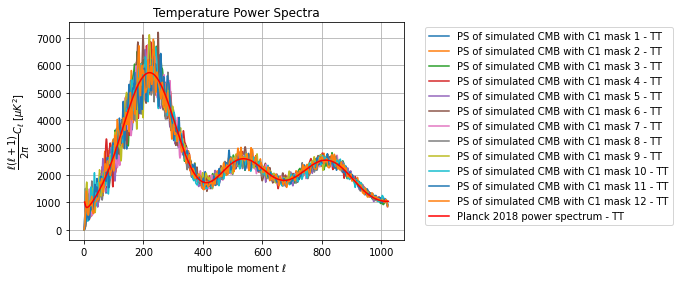

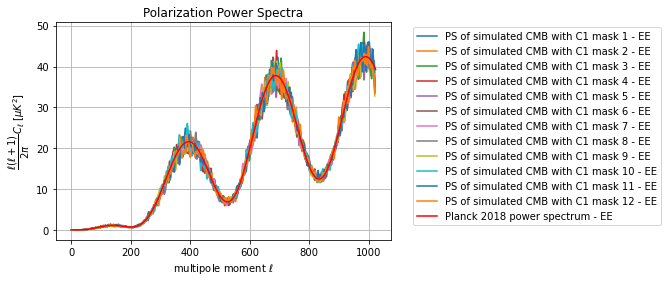

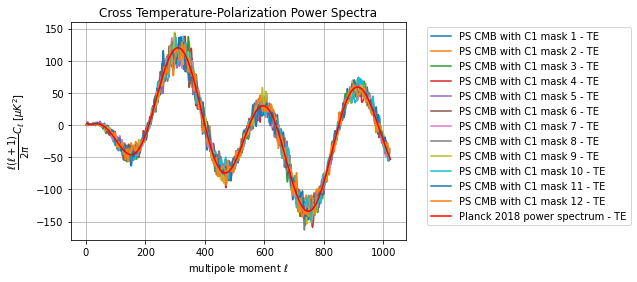

In [19]:
# plot of the TT power spectra
for i in range(len(maps_with_sharp_mask)):
    plt.plot(Dls[i][0][:-2], label='PS of simulated CMB with C1 mask %s - TT'%(i+1))
plt.title('Temperature Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,1], color='r', linestyle='-', label='Planck 2018 power spectrum - TT')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the EE power spectra
for i in range(len(maps_with_sharp_mask)):
    plt.plot(Dls[i][1][:-2], label='PS of simulated CMB with C1 mask %s - EE'%(i+1))
plt.title('Polarization Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,3], color='r', linestyle='-', label='Planck 2018 power spectrum - EE')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the TE power spectra
for i in range(len(maps_with_sharp_mask)):
    plt.plot(Dls[i][3][:-2], label='PS CMB with C1 mask %s - TE'%(i+1))
plt.title('Cross Temperature-Polarization Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,2], color='r', linestyle='-', label='Planck 2018 power spectrum - TE')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

### Comparison of the power spectra for the different apodisations and with and without the masks

In [17]:
# power spectra of the maps
Cl_sharp_mask = hp.sphtfunc.anafast(maps_with_sharp_mask[0], lmax=lmax)
Cl_smooth_mask = hp.sphtfunc.anafast(maps_with_smooth_mask[0], lmax=lmax)
Cl_C1_mask = hp.sphtfunc.anafast(maps_with_C1_mask[0], lmax=lmax)
Cl_C2_mask = hp.sphtfunc.anafast(maps_with_C2_mask[0], lmax=lmax)
Cl_full = hp.sphtfunc.anafast(CMB_map, lmax=lmax)


# values of f_sky, fraction of the covered sky (where there is the mask)
f_sky_sharp = 1/12

non_zero_Sm = masks_Sm[0][np.where(masks_Sm[0] != 0.0)]
sum_Sm = 0
for i in non_zero_Sm:
    sum_Sm += i
f_sky_Sm = sum_Sm/len(masks_Sm[0])

non_zero_C1 = masks_C1[0][np.where(masks_C1[0] != 0.0)]
sum_C1 = 0
for i in non_zero_C1:
    sum_C1 += i
f_sky_C1 = sum_C1/len(masks_C1[0])

non_zero_C2 = masks_C2[0][np.where(masks_C2[0] != 0.0)]
sum_C2 = 0
for i in non_zero_C2:
    sum_C2 += i
f_sky_C2 = sum_C2/len(masks_C2[0])


# binning
bin_size = 16
number_of_bins = int(lmax/bin_size)  # each bin contains bin_size values of l
x = ell[:number_of_bins]
x_new = []
for i in range(len(x)):
    x_new.append(x[i]*lmax/number_of_bins)
bin_means_list = [] # list of the mean Cl for each band

bin_PLA_PS = binned_statistic(ell, PLA_PS.T[:,:lmax+1], statistic='mean', bins=number_of_bins)


# correction for beam and pixel window function
ell = np.arange(Cl_sharp_mask.shape[1])
sigma = fwhm/2.35
    
Cl_beam = np.exp(- ell*(ell+1) * sigma**2)
Bl_pixwin = hp.sphtfunc.pixwin(nside, pol=True, lmax=lmax)
Cl_pixwin = [Bl_pixwin[i]**2 for i in range(len(Bl_pixwin))] # Cl = Bl^2

Cl_sharp_mask[0] /= (Cl_beam * Cl_pixwin[0] * f_sky_sharp) # TT  # Cl_pixwin[0] and Cl_pixwin[1] are identical
Cl_sharp_mask[1] /= (Cl_beam * Cl_pixwin[0] * f_sky_sharp) # EE
Cl_sharp_mask[3] /= (Cl_beam * Cl_pixwin[0] * f_sky_sharp) # TE

Cl_smooth_mask[0] /= (Cl_beam * Cl_pixwin[0] * f_sky_Sm) # TT
Cl_smooth_mask[1] /= (Cl_beam * Cl_pixwin[0] * f_sky_Sm) # EE
Cl_smooth_mask[3] /= (Cl_beam * Cl_pixwin[0] * f_sky_Sm) # TE

Cl_C1_mask[0] /= (Cl_beam * Cl_pixwin[0] * f_sky_C1) # TT
Cl_C1_mask[1] /= (Cl_beam * Cl_pixwin[0] * f_sky_C1) # EE
Cl_C1_mask[3] /= (Cl_beam * Cl_pixwin[0] * f_sky_C1) # TE

Cl_C2_mask[0] /= (Cl_beam * Cl_pixwin[0] * f_sky_C2) # TT
Cl_C2_mask[1] /= (Cl_beam * Cl_pixwin[0] * f_sky_C2) # EE
Cl_C2_mask[3] /= (Cl_beam * Cl_pixwin[0] * f_sky_C2) # TE

Cl_full[0] /= (Cl_beam * Cl_pixwin[0] * 1) # TT
Cl_full[1] /= (Cl_beam * Cl_pixwin[0] * 1) # EE
Cl_full[3] /= (Cl_beam * Cl_pixwin[0] * 1) # TE
    
Dl_sharp_mask = Cl_sharp_mask * ell * (ell+1) * 1e12 / (2*np.pi)
Dl_smooth_mask = Cl_smooth_mask * ell * (ell+1) * 1e12 / (2*np.pi)
Dl_C1_mask = Cl_C1_mask * ell * (ell+1) * 1e12 / (2*np.pi)
Dl_C2_mask = Cl_C2_mask * ell * (ell+1) * 1e12 / (2*np.pi)
Dl_full = Cl_full * ell * (ell+1) * 1e12 / (2*np.pi)

# binning
bin_means_sharp = binned_statistic(ell, Dl_sharp_mask, statistic='mean', bins=number_of_bins)
bin_means_list.append(bin_means_sharp)
bin_means_smooth = binned_statistic(ell, Dl_smooth_mask, statistic='mean', bins=number_of_bins)
bin_means_list.append(bin_means_smooth)
bin_means_C1 = binned_statistic(ell, Dl_C1_mask, statistic='mean', bins=number_of_bins)
bin_means_list.append(bin_means_C1)
bin_means_C2 = binned_statistic(ell, Dl_C2_mask, statistic='mean', bins=number_of_bins)
bin_means_list.append(bin_means_C2)


# difference between Planck PS, PS of the map with sharp mask and PS of the map with smooth mask
y_subtraction = [] # np.shape = (3, 3, lmax) = ((full,sharp,smooth),(TT,EE,TE),lmax)
y_full = []
y_TT_full = list(abs(np.array(Dl_full[0][:]) - np.array(PLA_PS.T[1,:lmax+1])))
y_EE_full = list(abs(np.array(Dl_full[1][:]) - np.array(PLA_PS.T[3,:lmax+1])))
y_TE_full = list(abs(np.array(Dl_full[3][:]) - np.array(PLA_PS.T[2,:lmax+1])))
y_full.append(y_TT_full)
y_full.append(y_EE_full)
y_full.append(y_TE_full)
y_subtraction.append(y_full)

y_sharp = []
y_TT_sharp = list(abs(np.array(Dl_sharp_mask[0][:]) - np.array(PLA_PS.T[1,:lmax+1])))
y_EE_sharp = list(abs(np.array(Dl_sharp_mask[1][:]) - np.array(PLA_PS.T[3,:lmax+1])))
y_TE_sharp = list(abs(np.array(Dl_sharp_mask[3][:]) - np.array(PLA_PS.T[2,:lmax+1])))
y_sharp.append(y_TT_sharp)
y_sharp.append(y_EE_sharp)
y_sharp.append(y_TE_sharp)
y_subtraction.append(y_sharp)

y_smooth = []
y_TT_smooth = list(abs(np.array(Dl_smooth_mask[0][:]) - np.array(PLA_PS.T[1,:lmax+1])))
y_EE_smooth = list(abs(np.array(Dl_smooth_mask[1][:]) - np.array(PLA_PS.T[3,:lmax+1])))
y_TE_smooth = list(abs(np.array(Dl_smooth_mask[3][:]) - np.array(PLA_PS.T[2,:lmax+1])))
y_smooth.append(y_TT_smooth)
y_smooth.append(y_EE_smooth)
y_smooth.append(y_TE_smooth)
y_subtraction.append(y_smooth)

y_C1 = []
y_TT_C1 = list(abs(np.array(Dl_C1_mask[0][:]) - np.array(PLA_PS.T[1,:lmax+1])))
y_EE_C1 = list(abs(np.array(Dl_C1_mask[1][:]) - np.array(PLA_PS.T[3,:lmax+1])))
y_TE_C1 = list(abs(np.array(Dl_C1_mask[3][:]) - np.array(PLA_PS.T[2,:lmax+1])))
y_C1.append(y_TT_C1)
y_C1.append(y_EE_C1)
y_C1.append(y_TE_C1)
y_subtraction.append(y_C1)

y_C2 = []
y_TT_C2 = list(abs(np.array(Dl_C2_mask[0][:]) - np.array(PLA_PS.T[1,:lmax+1])))
y_EE_C2 = list(abs(np.array(Dl_C2_mask[1][:]) - np.array(PLA_PS.T[3,:lmax+1])))
y_TE_C2 = list(abs(np.array(Dl_C2_mask[3][:]) - np.array(PLA_PS.T[2,:lmax+1])))
y_C2.append(y_TT_C2)
y_C2.append(y_EE_C2)
y_C2.append(y_TE_C2)
y_subtraction.append(y_C2)

#### Comparison of the power spectra for the different apodisations:

Plot of the power spectra of the maps with smooth, C1 apodisation and C2 apodisation masks:

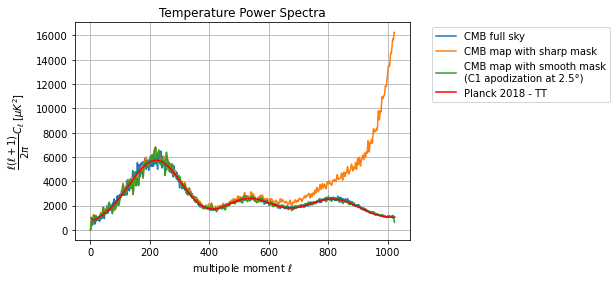

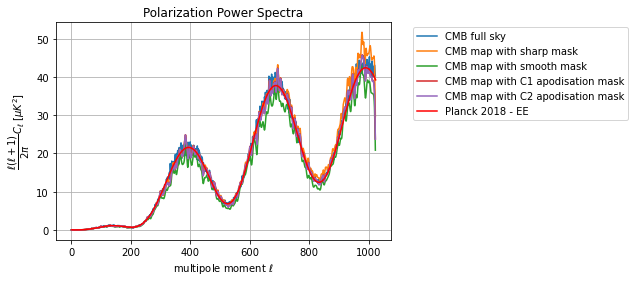

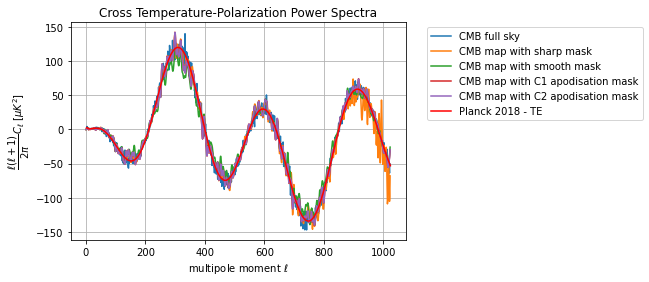

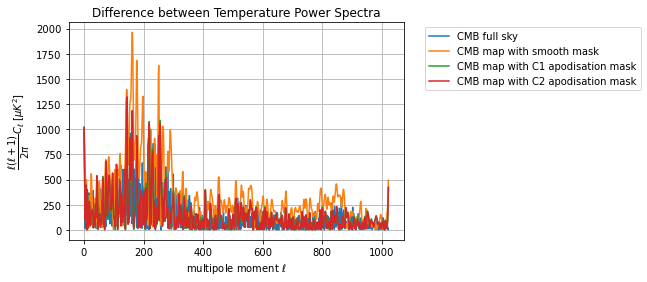

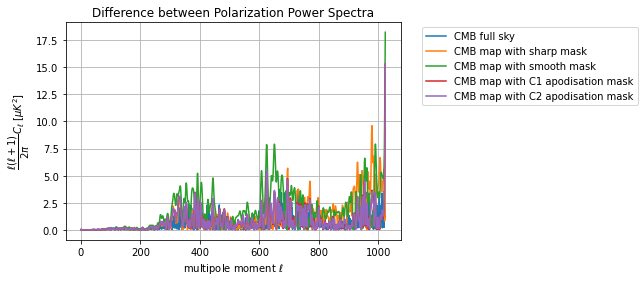

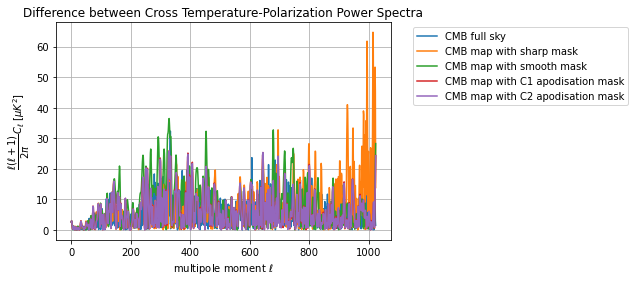

In [19]:
# plot of the TT power spectra
plt.plot(Dl_full[0][:], label='CMB full sky')
plt.plot(Dl_sharp_mask[0][:], label='CMB map with sharp mask')
#plt.plot(Dl_smooth_mask[0][:], label='CMB map with smooth mask')
#plt.plot(Dl_C1_mask[0][:], label='CMB map with C1 apodisation mask')
plt.plot(Dl_C1_mask[0][:], label='CMB map with smooth mask\n(C1 apodization at 2.5°)')
#plt.plot(Dl_C2_mask[0][:], label='CMB map with C2 apodisation mask')
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,1], color='r', linestyle='-', label='Planck 2018 - TT')
plt.title('Temperature Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the EE power spectra
plt.plot(Dl_full[1][:], label='CMB full sky')
plt.plot(Dl_sharp_mask[1][:], label='CMB map with sharp mask')
plt.plot(Dl_smooth_mask[1][:], label='CMB map with smooth mask')
plt.plot(Dl_C1_mask[1][:], label='CMB map with C1 apodisation mask')
plt.plot(Dl_C2_mask[1][:], label='CMB map with C2 apodisation mask')
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,3], color='r', linestyle='-', label='Planck 2018 - EE')
plt.title('Polarization Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the TE power spectra
plt.plot(Dl_full[3][:], label='CMB full sky')
plt.plot(Dl_sharp_mask[3][:], label='CMB map with sharp mask')
plt.plot(Dl_smooth_mask[3][:], label='CMB map with smooth mask')
plt.plot(Dl_C1_mask[3][:], label='CMB map with C1 apodisation mask')
plt.plot(Dl_C2_mask[3][:], label='CMB map with C2 apodisation mask')
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,2], color='r', linestyle='-', label='Planck 2018 - TE')
plt.title('Cross Temperature-Polarization Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

######################################################################################

# plot of the TT power spectra
plt.plot(ell,y_subtraction[0][0], label='CMB full sky')
#plt.plot(ell,y_subtraction[1][0], label='CMB map with sharp mask')
plt.plot(ell,y_subtraction[2][0], label='CMB map with smooth mask')
plt.plot(ell,y_subtraction[3][0], label='CMB map with C1 apodisation mask')
plt.plot(ell,y_subtraction[4][0], label='CMB map with C2 apodisation mask')
plt.title("Difference between Temperature Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the EE power spectra
plt.plot(ell,y_subtraction[0][1], label='CMB full sky')
plt.plot(ell,y_subtraction[1][1], label='CMB map with sharp mask')
plt.plot(ell,y_subtraction[2][1], label='CMB map with smooth mask')
plt.plot(ell,y_subtraction[3][1], label='CMB map with C1 apodisation mask')
plt.plot(ell,y_subtraction[4][1], label='CMB map with C2 apodisation mask')
plt.title("Difference between Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the TE power spectra
plt.plot(ell,y_subtraction[0][2], label='CMB full sky')
plt.plot(ell,y_subtraction[1][2], label='CMB map with sharp mask')
plt.plot(ell,y_subtraction[2][2], label='CMB map with smooth mask')
plt.plot(ell,y_subtraction[3][2], label='CMB map with C1 apodisation mask')
plt.plot(ell,y_subtraction[4][2], label='CMB map with C2 apodisation mask')
plt.title("Difference between Cross Temperature-Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

Plot of the binned power spectra of the maps with smooth, C1 apodisation and C2 apodisation masks:

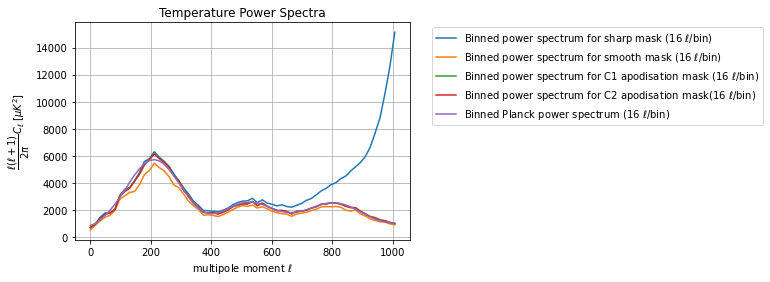

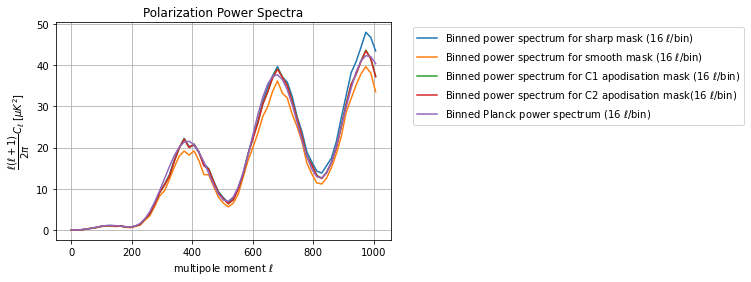

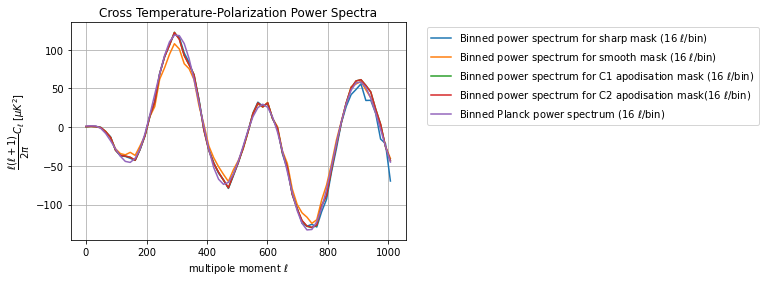

In [22]:
# plot of the TT power spectra
plt.plot(x_new,bin_means_list[0][0][0], label='Binned power spectrum for sharp mask (%s $\ell$/bin)' %bin_size)
plt.plot(x_new,bin_means_list[1][0][0], label='Binned power spectrum for smooth mask (%s $\ell$/bin)' %bin_size)
plt.plot(x_new,bin_means_list[2][0][0], label='Binned power spectrum for C1 apodisation mask (%s $\ell$/bin)' %bin_size)
plt.plot(x_new,bin_means_list[3][0][0], label='Binned power spectrum for C2 apodisation mask(%s $\ell$/bin)' %bin_size)
plt.plot(x_new,bin_PLA_PS[0][1], label='Binned Planck power spectrum (%s $\ell$/bin)' %bin_size)
plt.title("Temperature Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the EE power spectra
plt.plot(x_new,bin_means_list[0][0][1], label='Binned power spectrum for sharp mask (%s $\ell$/bin)' %bin_size)
plt.plot(x_new,bin_means_list[1][0][1], label='Binned power spectrum for smooth mask (%s $\ell$/bin)' %bin_size)
plt.plot(x_new,bin_means_list[2][0][1], label='Binned power spectrum for C1 apodisation mask (%s $\ell$/bin)' %bin_size)
plt.plot(x_new,bin_means_list[3][0][1], label='Binned power spectrum for C2 apodisation mask(%s $\ell$/bin)' %bin_size)
plt.plot(x_new,bin_PLA_PS[0][3], label='Binned Planck power spectrum (%s $\ell$/bin)' %bin_size)
plt.title("Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the TE power spectra
plt.plot(x_new,bin_means_list[0][0][3], label='Binned power spectrum for sharp mask (%s $\ell$/bin)' %bin_size)
plt.plot(x_new,bin_means_list[1][0][3], label='Binned power spectrum for smooth mask (%s $\ell$/bin)' %bin_size)
plt.plot(x_new,bin_means_list[2][0][3], label='Binned power spectrum for C1 apodisation mask (%s $\ell$/bin)' %bin_size)
plt.plot(x_new,bin_means_list[3][0][3], label='Binned power spectrum for C2 apodisation mask(%s $\ell$/bin)' %bin_size)
plt.plot(x_new,bin_PLA_PS[0][2], label='Binned Planck power spectrum (%s $\ell$/bin)' %bin_size)
plt.title("Cross Temperature-Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

### Study of the influence of the apodisation scale

Creation of the apodised masks:

In [23]:
masks_C1_loop = []
C1_apod_masks_loop = []

number_of_aposcales = 10

start_time = time.time()

for k in range(number_of_aposcales):
    # apodisation
    aposcale = 0.0 + 0.5*k # apodisation scale in degree
    masks_C1 = []
    for i in range(len(nested_masks)):
        mask_raw = nested_masks[i]
        mask_C1 = nmt.mask_apodization(mask_raw, aposcale, apotype="C1")
        masks_C1.append(mask_C1)
        #hp.mollview(mask_C1, title='Mask - C1 apodisation scale %s degree'%aposcale)
    masks_C1_loop.append(masks_C1)
    
    # back to ring format
    #C1_apod_masks = []
    #for i in range(12):
    #    C1_apod_masks.append(np.zeros(len(sharp_masks[0])))

    #for i in range(len(nested_masks)):
    #    new_place = hp.pixelfunc.ring2nest(Nside, np.arange(len(sharp_masks[0])))
    #    for j in range(len(new_place)):
    #        C1_apod_masks[i][new_place[j]] = masks_C1[i][j]
    #    #hp.mollview(C1_apod_masks[i], title='C1 apodisation - Mask %s (ring format)'%(i+1))
    #C1_apod_masks_loop.append(C1_apod_masks)

C1_apod_masks_loop = masks_C1_loop
    
print((time.time() - start_time)/60, "min") 

2.7433523138364158 min


Creation of the 12 maps:

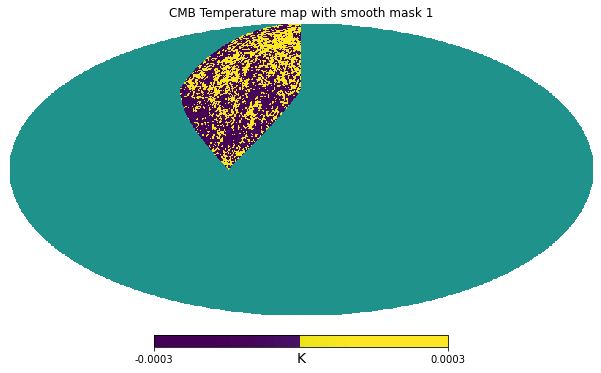

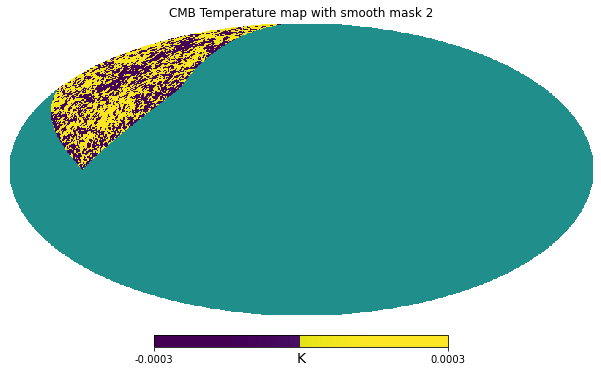

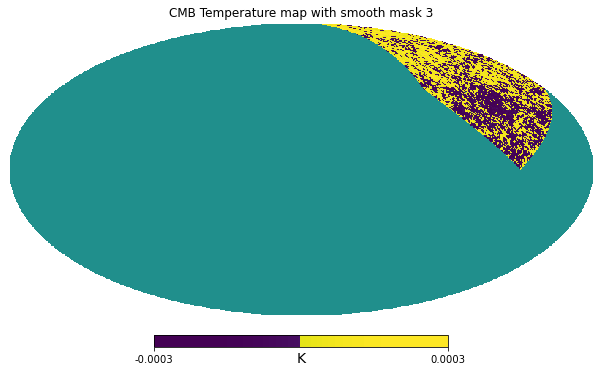

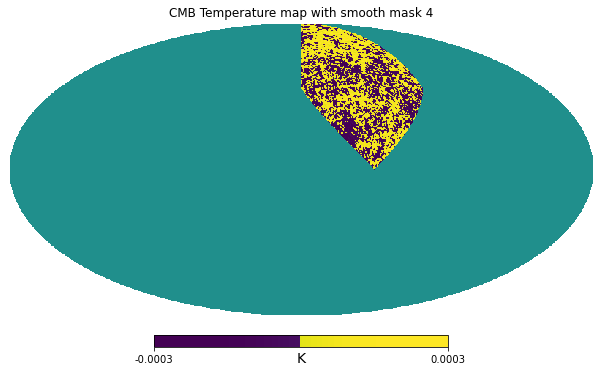

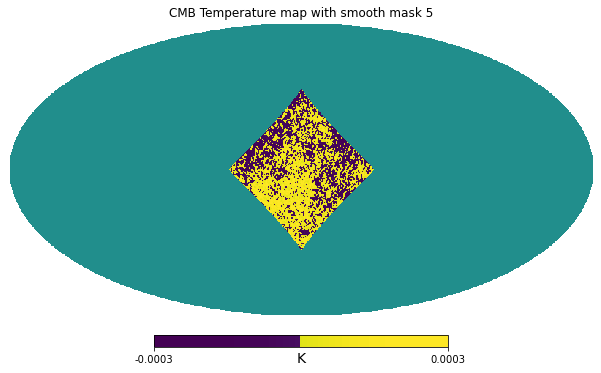

...

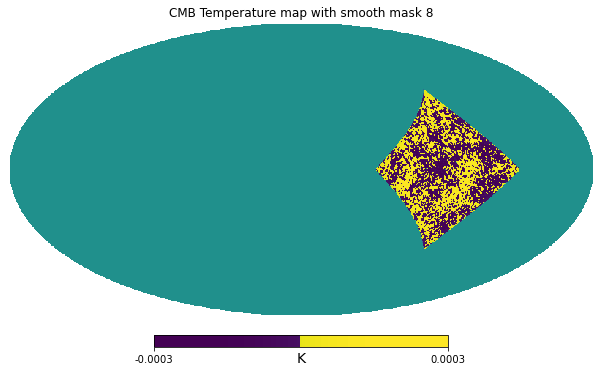

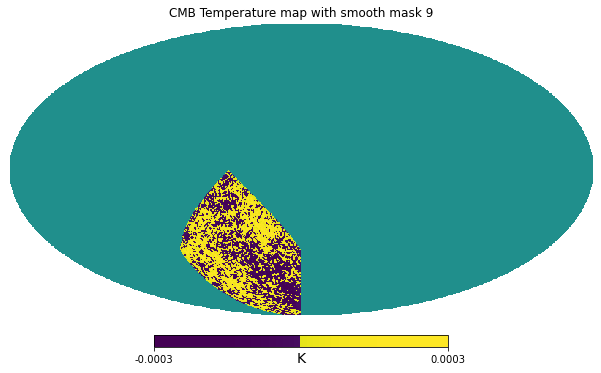

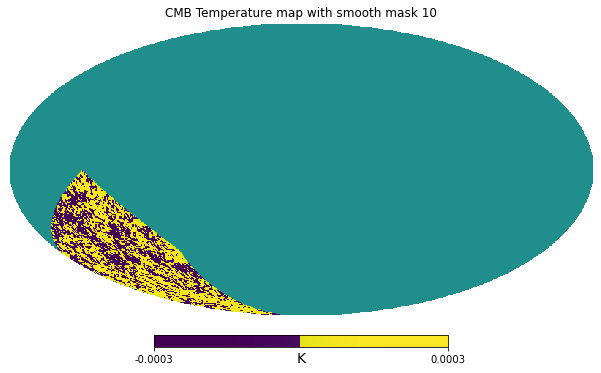

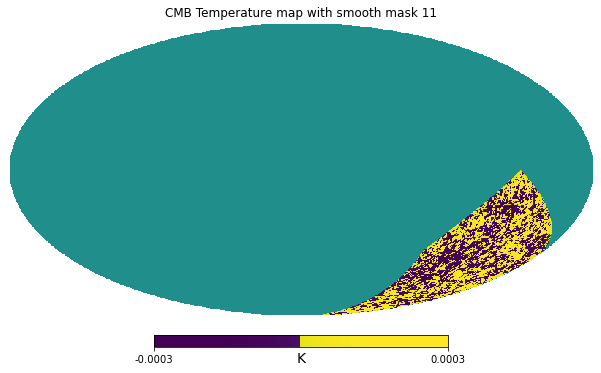

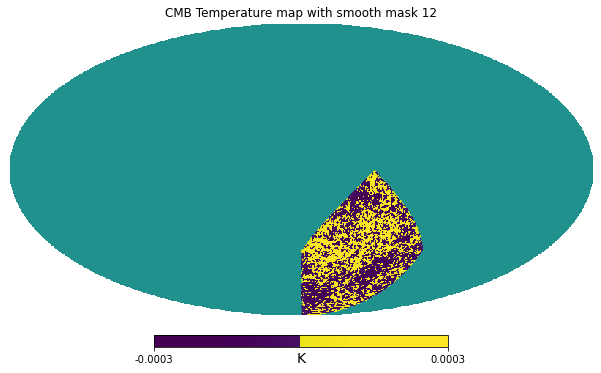

In [24]:
maps_with_C1_mask_loop = [] # masked maps for the different apodisation scales

for k in range(number_of_aposcales):

    maps_with_C1_mask = []

    for mask in C1_apod_masks_loop[k]:      # For each mask,
        new_map = []
        for i in range(len(CMB_map)):       # for the T, Q and U maps,
            new_map.append(CMB_map[i]*mask) # the mask is added to the map.
        maps_with_C1_mask.append(new_map)

    for i in range(len(maps_with_C1_mask)): # 12 maps
        hp.mollview(maps_with_C1_mask[i][0], norm='hist', min=-300*1e-6, max=300*1e-6, unit="K", nest=False, title="CMB Temperature map with smooth mask %s"%(i+1))
        #for m in maps_with_C1_mask[i][1:]: # Q and U maps
            #hp.mollview(m, norm='hist', min=-30*1e-6, max=30*1e-6, unit="K", nest=True, title="CMB Polarization map with smooth mask %s"%(i+1))
    maps_with_C1_mask_loop.append(maps_with_C1_mask)

In [25]:
PLA_PS = np.loadtxt("COM_PowerSpect_CMB-base-plikHM-TTTEEE-lowl-lowE-lensing-minimum-theory_R3.01.txt")

sigma = fwhm/2.35
f_sky = 1/12 # fraction of the covered sky (mask)

# values of f_sky, fraction of the covered sky (where there is the mask)
f_sky_sharp = 1/12

non_zero_C1 = masks_C1[0][np.where(masks_C1[0] != 0.0)]
sum_C1 = 0
for i in non_zero_C1:
    sum_C1 += i
f_sky_C1 = sum_C1/len(masks_C1[0])

# binning
bin_size = 16
number_of_bins = int(lmax/bin_size)  # each bin contains bin_size values of l
ell = np.arange(hp.sphtfunc.anafast(maps_with_C1_mask_loop[0][0], lmax=lmax).shape[1])
x = ell[:number_of_bins]
x_new = []
for i in range(len(x)):
    x_new.append(x[i]*lmax/number_of_bins)
bin_list_sharp = [] # list of the mean Cl for each band
bin_list_C1 = []

bin_PLA_PS = binned_statistic(ell, PLA_PS.T[:,:lmax+1], statistic='mean', bins=number_of_bins)

# beam and pixel window function
Cl_beam = np.exp(- ell*(ell+1) * sigma**2)
Bl_pixwin = hp.sphtfunc.pixwin(nside, pol=True, lmax=lmax)
Cl_pixwin = [Bl_pixwin[i]**2 for i in range(len(Bl_pixwin))] # Cl = Bl^2

Computation of the power spectra:

In [26]:
Cl_C1_loop = []
Dl_C1_loop = []
bin_C1_loop = []
y_subtraction_loop = [] # np.shape = (10, 3, lmax) = (C1 for all aposcale,(TT,EE,TE),lmax)

for k in range(number_of_aposcales):

    # power spectra of the maps
    Cl_C1 = hp.sphtfunc.anafast(maps_with_C1_mask_loop[k][0], lmax=lmax)
    Cl_C1_loop.append(Cl_C1)
    
    #non_zero_C1 = masks_C1_loop[k][0][np.where(masks_C1_loop[k][0] != 0.0)]
    #sum_C1 = 0
    #for i in non_zero_C1:
    #    sum_C1 += i
    #f_sky_C1 = sum_C1/len(masks_C1_loop[k][0])
    non_zero_C1 = C1_apod_masks_loop[k][0][np.where(C1_apod_masks_loop[k][0] != 0.0)]
    sum_C1 = 0
    for i in non_zero_C1:
        sum_C1 += i
    f_sky_C1 = sum_C1/len(C1_apod_masks_loop[k][0])

    # correction for beam and pixel window function
    Cl_C1[0] /= (Cl_beam * Cl_pixwin[0] * f_sky_C1) # TT
    Cl_C1[1] /= (Cl_beam * Cl_pixwin[0] * f_sky_C1) # EE
    Cl_C1[3] /= (Cl_beam * Cl_pixwin[0] * f_sky_C1) # TE
    
    Dl_C1 = Cl_C1 * ell * (ell+1) * 1e12 / (2*np.pi)
    Dl_C1_loop.append(Dl_C1)

    # binning
    bin_means_C1 = binned_statistic(ell, Dl_C1, statistic='mean', bins=number_of_bins)
    bin_C1_loop.append(bin_means_C1)

    # difference between Planck PS, PS of the map with sharp mask and PS of the map with smooth mask
    y_C1 = []
    y_TT_C1 = list(abs(np.array(Dl_C1[0][:]) - np.array(PLA_PS.T[1,:lmax+1])))
    y_EE_C1 = list(abs(np.array(Dl_C1[1][:]) - np.array(PLA_PS.T[3,:lmax+1])))
    y_TE_C1 = list(abs(np.array(Dl_C1[3][:]) - np.array(PLA_PS.T[2,:lmax+1])))
    y_C1.append(y_TT_C1)
    y_C1.append(y_EE_C1)
    y_C1.append(y_TE_C1)
    y_subtraction_loop.append(y_C1)

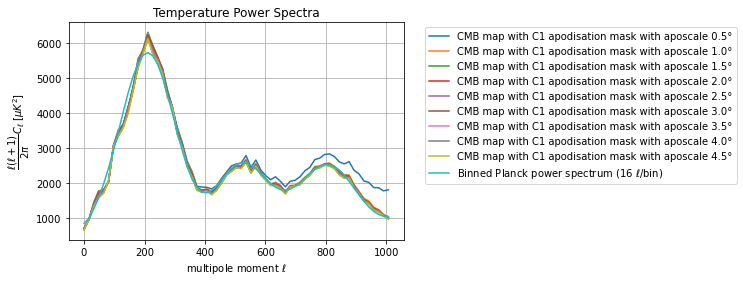

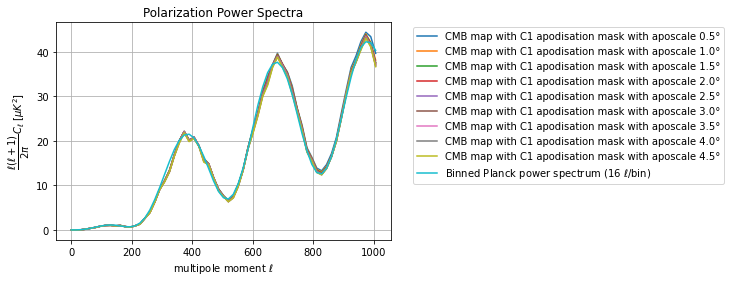

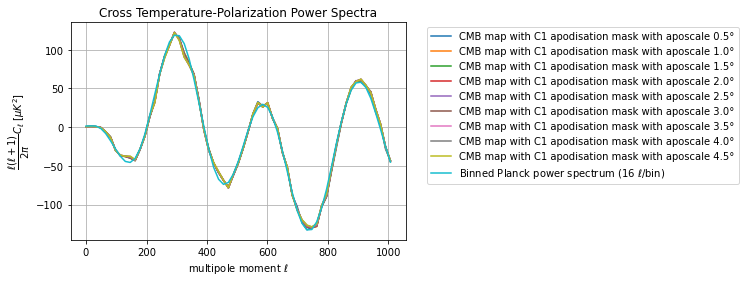

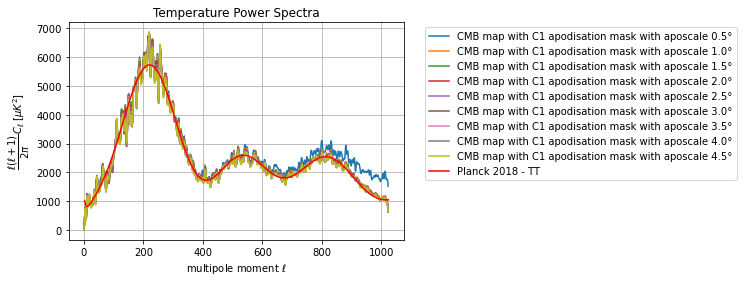

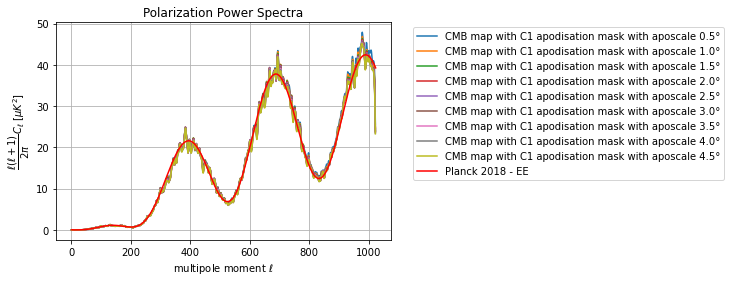

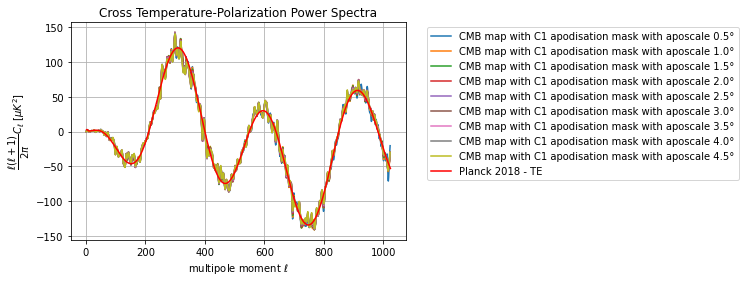

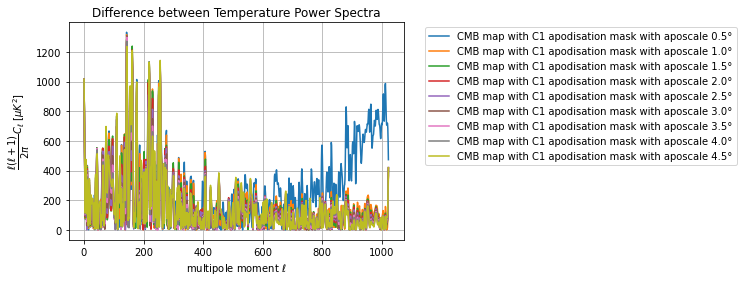

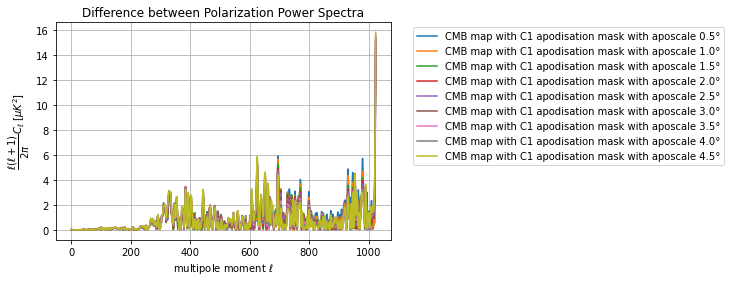

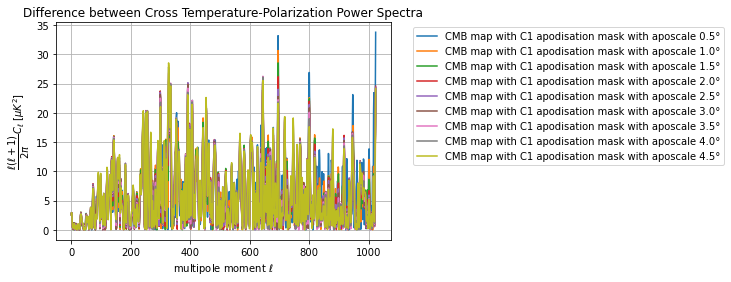

In [28]:
# plot of the TT power spectra
for k in range(1,number_of_aposcales):
    plt.plot(x_new,bin_C1_loop[k][0][0], label='CMB map with C1 apodisation mask with aposcale %s°'%(0.0+0.5*k))
plt.plot(x_new,bin_PLA_PS[0][1], label='Binned Planck power spectrum (%s $\ell$/bin)' %bin_size)
plt.title("Temperature Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the EE power spectra
for k in range(1,number_of_aposcales):
    plt.plot(x_new,bin_C1_loop[k][0][1], label='CMB map with C1 apodisation mask with aposcale %s°'%(0.0+0.5*k))
plt.plot(x_new,bin_PLA_PS[0][3], label='Binned Planck power spectrum (%s $\ell$/bin)' %bin_size)
plt.title("Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the TE power spectra
for k in range(1,number_of_aposcales):
    plt.plot(x_new,bin_C1_loop[k][0][3], label='CMB map with C1 apodisation mask with aposcale %s°'%(0.0+0.5*k))
plt.plot(x_new,bin_PLA_PS[0][2], label='Binned Planck power spectrum (%s $\ell$/bin)' %bin_size)
plt.title("Cross Temperature-Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

#############################################################################################

# plot of the TT power spectra
for k in range(1,number_of_aposcales):
    plt.plot(Dl_C1_loop[k][0][:], label='CMB map with C1 apodisation mask with aposcale %s°'%(0.0 + 0.5*k))
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,1], color='r', linestyle='-', label='Planck 2018 - TT')
plt.title('Temperature Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the EE power spectra
for k in range(1,number_of_aposcales):
    plt.plot(Dl_C1_loop[k][1][:], label='CMB map with C1 apodisation mask with aposcale %s°'%(0.0 + 0.5*k))
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,3], color='r', linestyle='-', label='Planck 2018 - EE')
plt.title('Polarization Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the TE power spectra
for k in range(1,number_of_aposcales):
    plt.plot(Dl_C1_loop[k][3][:], label='CMB map with C1 apodisation mask with aposcale %s°'%(0.0 + 0.5*k))
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,2], color='r', linestyle='-', label='Planck 2018 - TE')
plt.title('Cross Temperature-Polarization Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

#############################################################################################

# plot of the TT power spectra
for k in range(1,number_of_aposcales):
    plt.plot(ell,y_subtraction_loop[k][0], label='CMB map with C1 apodisation mask with aposcale %s°'%(0.0+0.5*k))
plt.title("Difference between Temperature Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the EE power spectra
for k in range(1,number_of_aposcales):
    plt.plot(ell,y_subtraction_loop[k][1], label='CMB map with C1 apodisation mask with aposcale %s°'%(0.0+0.5*k))
plt.title("Difference between Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the TE power spectra
for k in range(1,number_of_aposcales):
    plt.plot(ell,y_subtraction_loop[k][2], label='CMB map with C1 apodisation mask with aposcale %s°'%(0.0+0.5*k))
plt.title("Difference between Cross Temperature-Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

Same study (quicker, with more apodisations):

In [51]:
PLA_PS = np.loadtxt("COM_PowerSpect_CMB-base-plikHM-TTTEEE-lowl-lowE-lensing-minimum-theory_R3.01.txt")

sigma = fwhm/2.35
f_sky = 1/12 # fraction of the covered sky (mask)

# values of f_sky, fraction of the covered sky (where there is the mask)
f_sky_sharp = 1/12

non_zero_C1 = masks_C1[0][np.where(masks_C1[0] != 0.0)]
sum_C1 = 0
for i in non_zero_C1:
    sum_C1 += i
f_sky_C1 = sum_C1/len(masks_C1[0])

# binning
bin_size = 16
number_of_bins = int(lmax/bin_size)  # each bin contains bin_size values of l
ell = np.arange(hp.sphtfunc.anafast(maps_with_C1_mask_apod[0], lmax=lmax).shape[1])
x = ell[:number_of_bins]
x_new = []
for i in range(len(x)):
    x_new.append(x[i]*lmax/number_of_bins)
bin_list_sharp = [] # list of the mean Cl for each band
bin_list_C1 = []

bin_PLA_PS = binned_statistic(ell, PLA_PS.T[:,:lmax+1], statistic='mean', bins=number_of_bins)

# beam and pixel window function
Cl_beam = np.exp(- ell*(ell+1) * sigma**2)
Bl_pixwin = hp.sphtfunc.pixwin(nside, pol=True, lmax=lmax)
Cl_pixwin = [Bl_pixwin[i]**2 for i in range(len(Bl_pixwin))] # Cl = Bl^2

In [96]:
masks_C1_apod = []

number_of_aposcales = 3
aposcales = [0.5, 2.5, 10]

for aposcale in aposcales:
    mask_raw = nested_masks[4]
    mask_C1 = nmt.mask_apodization(mask_raw, aposcale, apotype="C1")
    masks_C1_apod.append(mask_C1)
    

tot_bin_C1_apod = []

for j in range(10): # 10 simulations
    Cl_C1_apod = []
    Dl_C1_apod = []
    bin_C1_apod = []
    alm = hp.synalm((cl.TT, cl.EE, cl.BB, cl.TE), lmax=lmax, new=True)        # creation of alm from cl
    CMB_map = hp.alm2map(alm, nside=nside, lmax=lmax, pixwin=True, fwhm=fwhm) # returns a list of T,Q,U maps from alm
    
    for k in range(number_of_aposcales):

        # power spectra of the maps
        Cl_C1 = hp.sphtfunc.anafast(CMB_map*masks_C1_apod[k], lmax=lmax)
        Cl_C1_apod.append(Cl_C1)

        non_zero_C1 = masks_C1_apod[k][np.where(masks_C1_apod[k] != 0.0)]
        sum_C1 = 0
        for i in non_zero_C1:
            sum_C1 += i
        f_sky_C1 = sum_C1/len(masks_C1_apod[k])

        # correction for beam and pixel window function
        Cl_C1[0] /= (Cl_beam * Cl_pixwin[0] * f_sky_C1) # TT
        Cl_C1[1] /= (Cl_beam * Cl_pixwin[0] * f_sky_C1) # EE
        Cl_C1[3] /= (Cl_beam * Cl_pixwin[0] * f_sky_C1) # TE

        Dl_C1 = Cl_C1 * ell * (ell+1) * 1e12 / (2*np.pi)
        Dl_C1_apod.append(Dl_C1)

        # binning
        bin_means_C1 = binned_statistic(ell, Dl_C1, statistic='mean', bins=number_of_bins)
        bin_C1_apod.append(bin_means_C1[0])
        
    tot_bin_C1_apod.append(bin_C1_apod) 
    

mean_C1_apod = 0
for j in range(len(tot_bin_C1_apod)):
    mean_C1_apod += np.array(tot_bin_C1_apod[j])
mean_C1_apod /= len(tot_bin_C1_apod)

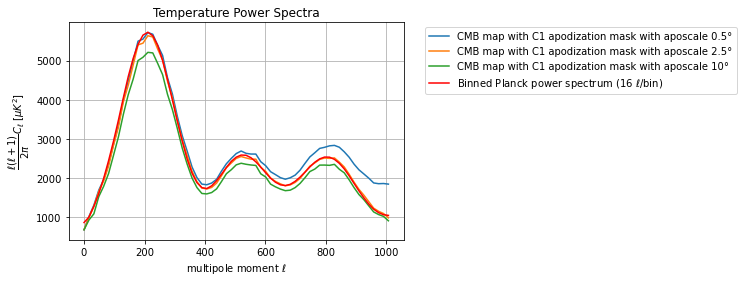

In [97]:
# plot of the TT power spectra
for k in range(number_of_aposcales):
    #plt.plot(x_new,bin_C1_apod[k][0][0], label='CMB map with C1 apodization mask with aposcale %s°'%(0.5+2*k))
    plt.plot(x_new,mean_C1_apod[k][0], label='CMB map with C1 apodization mask with aposcale %s°'%aposcales[k])
plt.plot(x_new,bin_PLA_PS[0][1], 'r', label='Binned Planck power spectrum (%s $\ell$/bin)' %bin_size,)
plt.title("Temperature Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

(Study of of problem that is resolved now) In order to understand why the PS are even more different from the PS ones than the masks are apodised, let's do the same study with masks from the Planck Legacy Archive, that cover more or less of the galaxy plane (plots for 20% of the sky masked):

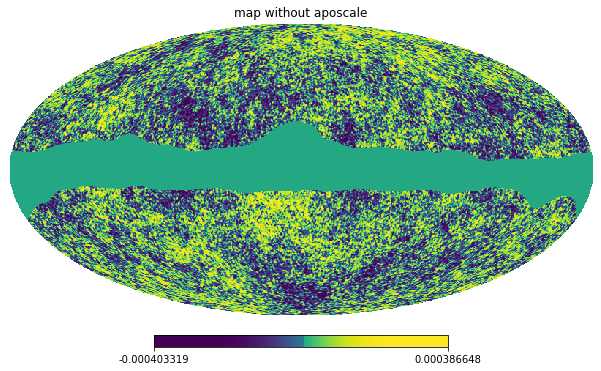

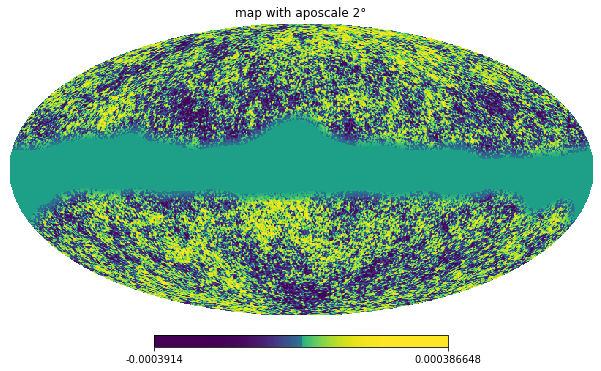

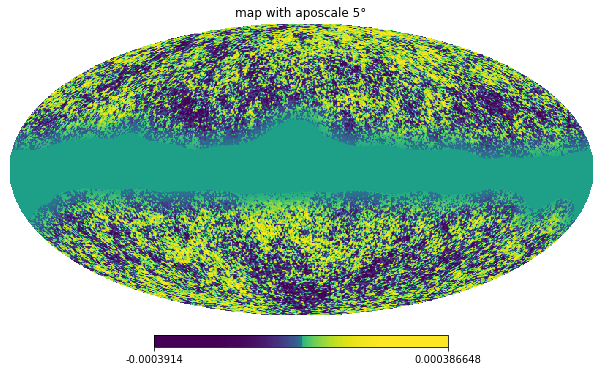

In [29]:
# Obtaining the masks with the same Nside as the maps

gal_mask = []
degraded_masks = []

for i in range(0,8): # there are 8 masks
    gal_mask.append(hp.read_map('./HFI_Mask_GalPlane-apo0_2048_R2.00.fits', field=i))
    degraded_masks.append(hp.pixelfunc.ud_grade(gal_mask[i], nside_out=512))
    #hp.mollview(degraded_masks[i], norm='hist')
    
gal_mask_apo2 = []
degraded_masks_apo2 = []

for i in range(0,8): # there are 8 masks
    gal_mask_apo2.append(hp.read_map('./HFI_Mask_GalPlane-apo2_2048_R2.00.fits', field=i))
    degraded_masks_apo2.append(hp.pixelfunc.ud_grade(gal_mask_apo2[i], nside_out=512))
    #hp.mollview(degraded_masks[i], norm='hist')
    
gal_mask_apo5 = []
degraded_masks_apo5 = []

for i in range(0,8): # there are 8 masks
    gal_mask_apo5.append(hp.read_map('./HFI_Mask_GalPlane-apo5_2048_R2.00.fits', field=i))
    degraded_masks_apo5.append(hp.pixelfunc.ud_grade(gal_mask_apo5[i], nside_out=512))
    #hp.mollview(degraded_masks[i], norm='hist')

    
# Obtaining the masked maps

maps_with_Planck_mask = []
    
for mask in degraded_masks:             # For each mask,
    new_map = []
    for i in range(len(CMB_map)):       # for the T, Q and U maps,
        new_map.append(CMB_map[i]*mask) # the mask is added to the map.
        #hp.mollview(CMB_map[i]*mask, norm='hist')
    maps_with_Planck_mask.append(new_map)
hp.mollview(maps_with_Planck_mask[4][0], norm='hist', title='map without aposcale')
    
maps_with_Planck_mask_apo2 = []
    
for mask in degraded_masks_apo2:        # For each mask,
    new_map = []
    for i in range(len(CMB_map)):       # for the T, Q and U maps,
        new_map.append(CMB_map[i]*mask) # the mask is added to the map.
        #hp.mollview(CMB_map[i]*mask, norm='hist')
    maps_with_Planck_mask_apo2.append(new_map)
hp.mollview(maps_with_Planck_mask_apo2[4][0], norm='hist', title='map with aposcale 2°')


maps_with_Planck_mask_apo5 = []
    
for mask in degraded_masks_apo5:        # For each mask,
    new_map = []
    for i in range(len(CMB_map)):       # for the T, Q and U maps,
        new_map.append(CMB_map[i]*mask) # the mask is added to the map.
        #hp.mollview(CMB_map[i]*mask, norm='hist')
    maps_with_Planck_mask_apo5.append(new_map)
hp.mollview(maps_with_Planck_mask_apo5[4][0], norm='hist', title='map with aposcale 5°')

In [30]:
y_subtraction_Pl = [] # np.shape = (10, 3, lmax) = (C1 for all aposcale,(TT,EE,TE),lmax)


# power spectra of the maps
Cl_Pl = hp.sphtfunc.anafast(maps_with_Planck_mask[4], lmax=lmax)
Cl_Pl_apo2 = hp.sphtfunc.anafast(maps_with_Planck_mask_apo2[4], lmax=lmax)
Cl_Pl_apo5 = hp.sphtfunc.anafast(maps_with_Planck_mask_apo5[4], lmax=lmax)

non_zero_Pl = degraded_masks[4][np.where(degraded_masks[4] != 0.0)]
sum_Pl = 0
for i in non_zero_Pl:
    sum_Pl += i
f_sky_Pl = sum_Pl/len(degraded_masks[4])

non_zero_Pl_apo2 = degraded_masks_apo2[4][np.where(degraded_masks_apo2[4] != 0.0)]
sum_Pl = 0
for i in non_zero_Pl_apo2:
    sum_Pl += i
f_sky_Pl_apo2 = sum_Pl/len(degraded_masks_apo2[4])

non_zero_Pl_apo5 = degraded_masks_apo5[4][np.where(degraded_masks_apo5[4] != 0.0)]
sum_Pl = 0
for i in non_zero_Pl_apo5:
    sum_Pl += i
f_sky_Pl_apo5 = sum_Pl/len(degraded_masks_apo5[4])

# correction for beam and pixel window function
Cl_Pl[0] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl) # TT
Cl_Pl[1] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl) # EE
Cl_Pl[3] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl) # TE

Cl_Pl_apo2[0] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl_apo2) # TT
Cl_Pl_apo2[1] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl_apo2) # EE
Cl_Pl_apo2[3] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl_apo2) # TE

Cl_Pl_apo5[0] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl_apo5) # TT
Cl_Pl_apo5[1] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl_apo5) # EE
Cl_Pl_apo5[3] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl_apo5) # TE

Dl_Pl = Cl_Pl * ell * (ell+1) * 1e12 / (2*np.pi)
Dl_Pl_apo2 = Cl_Pl_apo2 * ell * (ell+1) * 1e12 / (2*np.pi)
Dl_Pl_apo5 = Cl_Pl_apo5 * ell * (ell+1) * 1e12 / (2*np.pi)

# binning
bin_means_Pl = binned_statistic(ell, Dl_Pl, statistic='mean', bins=number_of_bins)
bin_means_Pl_apo2 = binned_statistic(ell, Dl_Pl_apo2, statistic='mean', bins=number_of_bins)
bin_means_Pl_apo5 = binned_statistic(ell, Dl_Pl_apo5, statistic='mean', bins=number_of_bins)

# difference between Planck PS, PS of the map with sharp mask and PS of the map with smooth mask
y_Pl = []
y_TT_Pl = list(abs(np.array(Dl_Pl[0][:]) - np.array(PLA_PS.T[1,:lmax+1])))
y_EE_Pl = list(abs(np.array(Dl_Pl[1][:]) - np.array(PLA_PS.T[3,:lmax+1])))
y_TE_Pl = list(abs(np.array(Dl_Pl[3][:]) - np.array(PLA_PS.T[2,:lmax+1])))
y_Pl.append(y_TT_Pl)
y_Pl.append(y_EE_Pl)
y_Pl.append(y_TE_Pl)
y_subtraction_Pl.append(y_Pl)

y_Pl_apo2 = []
y_TT_Pl_apo2 = list(abs(np.array(Dl_Pl_apo2[0][:]) - np.array(PLA_PS.T[1,:lmax+1])))
y_EE_Pl_apo2 = list(abs(np.array(Dl_Pl_apo2[1][:]) - np.array(PLA_PS.T[3,:lmax+1])))
y_TE_Pl_apo2 = list(abs(np.array(Dl_Pl_apo2[3][:]) - np.array(PLA_PS.T[2,:lmax+1])))
y_Pl_apo2.append(y_TT_Pl_apo2)
y_Pl_apo2.append(y_EE_Pl_apo2)
y_Pl_apo2.append(y_TE_Pl_apo2)
y_subtraction_Pl.append(y_Pl_apo2)

y_Pl_apo5 = []
y_TT_Pl_apo5 = list(abs(np.array(Dl_Pl_apo5[0][:]) - np.array(PLA_PS.T[1,:lmax+1])))
y_EE_Pl_apo5 = list(abs(np.array(Dl_Pl_apo5[1][:]) - np.array(PLA_PS.T[3,:lmax+1])))
y_TE_Pl_apo5 = list(abs(np.array(Dl_Pl_apo5[3][:]) - np.array(PLA_PS.T[2,:lmax+1])))
y_Pl_apo5.append(y_TT_Pl_apo5)
y_Pl_apo5.append(y_EE_Pl_apo5)
y_Pl_apo5.append(y_TE_Pl_apo5)
y_subtraction_Pl.append(y_Pl_apo5)

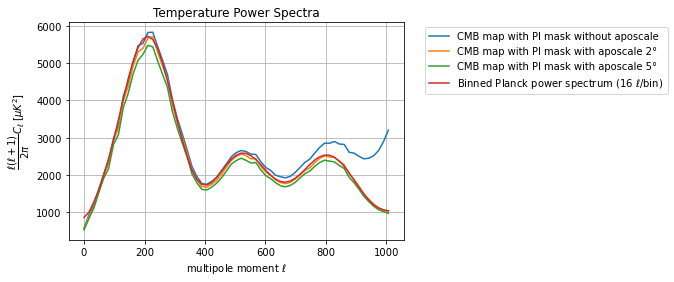

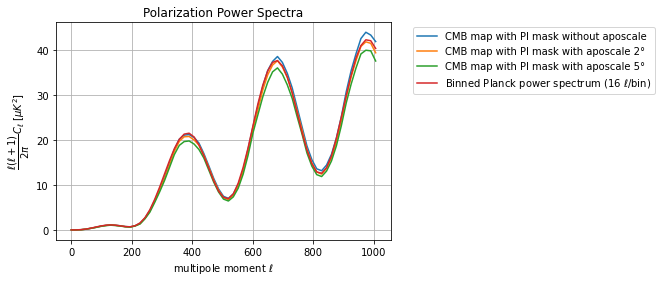

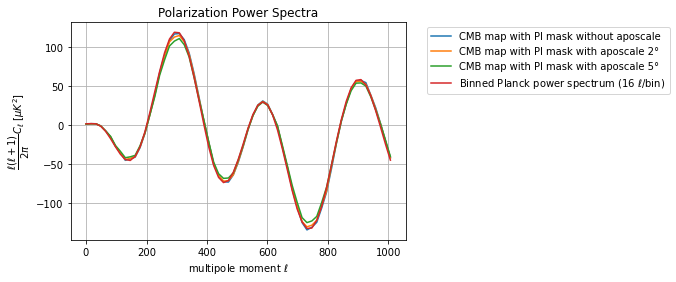

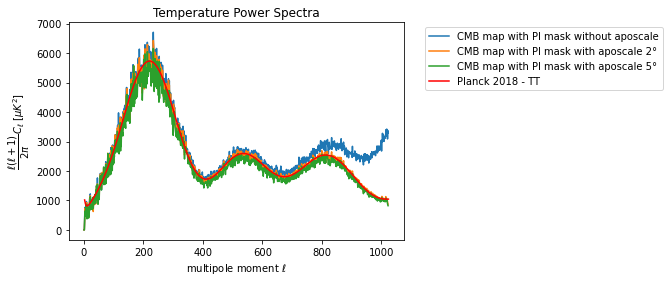

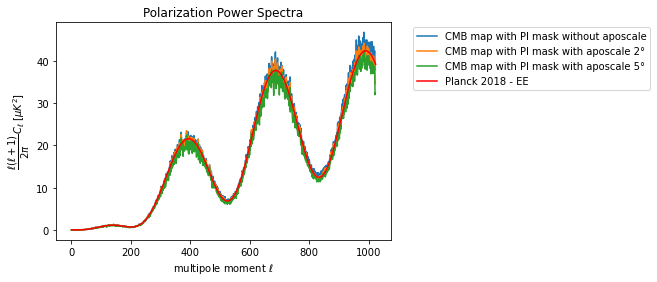

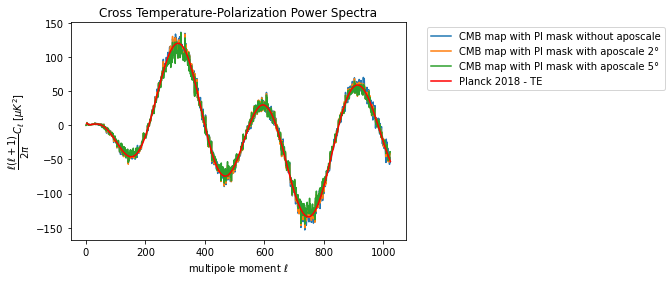

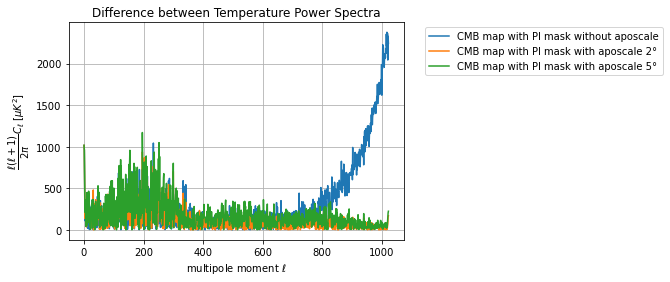

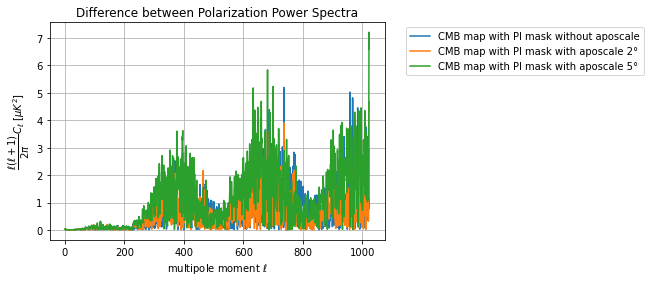

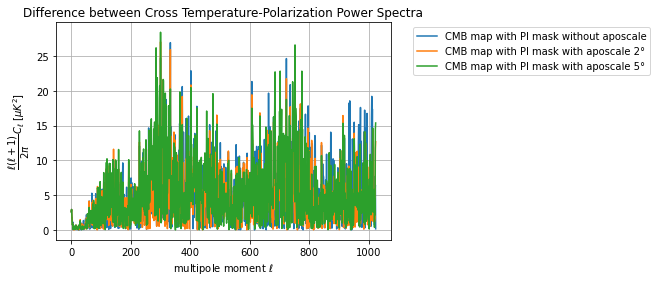

In [31]:
# plot of the TT power spectra
plt.plot(x_new,bin_means_Pl[0][0], label='CMB map with Pl mask without aposcale')
plt.plot(x_new,bin_means_Pl_apo2[0][0], label='CMB map with Pl mask with aposcale 2°')
plt.plot(x_new,bin_means_Pl_apo5[0][0], label='CMB map with Pl mask with aposcale 5°')
plt.plot(x_new,bin_PLA_PS[0][1], label='Binned Planck power spectrum (%s $\ell$/bin)' %bin_size)
plt.title("Temperature Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the EE power spectra
plt.plot(x_new,bin_means_Pl[0][1], label='CMB map with Pl mask without aposcale')
plt.plot(x_new,bin_means_Pl_apo2[0][1], label='CMB map with Pl mask with aposcale 2°')
plt.plot(x_new,bin_means_Pl_apo5[0][1], label='CMB map with Pl mask with aposcale 5°')
plt.plot(x_new,bin_PLA_PS[0][3], label='Binned Planck power spectrum (%s $\ell$/bin)' %bin_size)
plt.title("Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the TE power spectra
plt.plot(x_new,bin_means_Pl[0][3], label='CMB map with Pl mask without aposcale')
plt.plot(x_new,bin_means_Pl_apo2[0][3], label='CMB map with Pl mask with aposcale 2°')
plt.plot(x_new,bin_means_Pl_apo5[0][3], label='CMB map with Pl mask with aposcale 5°')
plt.plot(x_new,bin_PLA_PS[0][2], label='Binned Planck power spectrum (%s $\ell$/bin)' %bin_size)
plt.title("Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

#############################################################################################

# plot of the TT power spectra
plt.plot(Dl_Pl[0][:], label='CMB map with Pl mask without aposcale')
plt.plot(Dl_Pl_apo2[0][:], label='CMB map with Pl mask with aposcale 2°')
plt.plot(Dl_Pl_apo5[0][:], label='CMB map with Pl mask with aposcale 5°')
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,1], color='r', linestyle='-', label='Planck 2018 - TT')
plt.title('Temperature Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

# plot of the EE power spectra
plt.plot(Dl_Pl[1][:], label='CMB map with Pl mask without aposcale')
plt.plot(Dl_Pl_apo2[1][:], label='CMB map with Pl mask with aposcale 2°')
plt.plot(Dl_Pl_apo5[1][:], label='CMB map with Pl mask with aposcale 5°')
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,3], color='r', linestyle='-', label='Planck 2018 - EE')
plt.title('Polarization Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

# plot of the TE power spectra
plt.plot(Dl_Pl[3][:], label='CMB map with Pl mask without aposcale')
plt.plot(Dl_Pl_apo2[3][:], label='CMB map with Pl mask with aposcale 2°')
plt.plot(Dl_Pl_apo5[3][:], label='CMB map with Pl mask with aposcale 5°')
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,2], color='r', linestyle='-', label='Planck 2018 - TE')
plt.title('Cross Temperature-Polarization Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

#############################################################################################

# plot of the TT power spectra
plt.plot(ell,y_subtraction_Pl[0][0], label='CMB map with Pl mask without aposcale')
plt.plot(ell,y_subtraction_Pl[1][0], label='CMB map with Pl mask with aposcale 2°')
plt.plot(ell,y_subtraction_Pl[2][0], label='CMB map with Pl mask with aposcale 5°')
plt.title("Difference between Temperature Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the EE power spectra
plt.plot(ell,y_subtraction_Pl[0][1], label='CMB map with Pl mask without aposcale')
plt.plot(ell,y_subtraction_Pl[1][1], label='CMB map with Pl mask with aposcale 2°')
plt.plot(ell,y_subtraction_Pl[2][1], label='CMB map with Pl mask with aposcale 5°')
plt.title("Difference between Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the TE power spectra
plt.plot(ell,y_subtraction_Pl[0][2], label='CMB map with Pl mask without aposcale')
plt.plot(ell,y_subtraction_Pl[1][2], label='CMB map with Pl mask with aposcale 2°')
plt.plot(ell,y_subtraction_Pl[2][2], label='CMB map with Pl mask with aposcale 5°')
plt.title("Difference between Cross Temperature-Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

Same thing, but this time, I don't use the masked maps of PLA, I create the apodised masks with the namaster method:

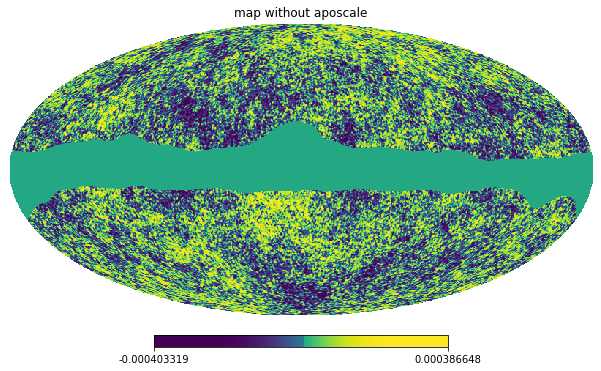

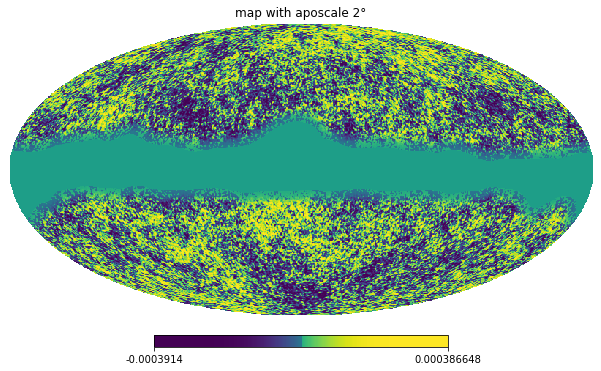

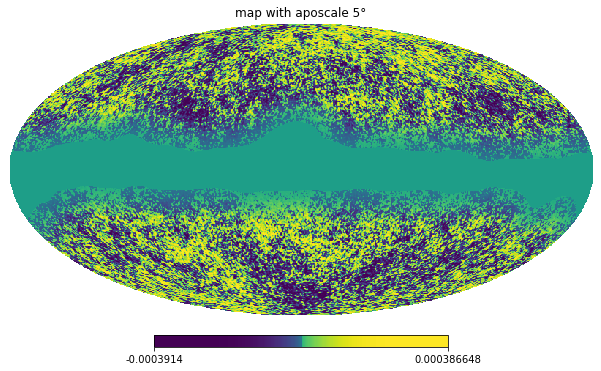

In [32]:
# Obtaining the masks with the same Nside as the maps

gal_mask = []
degraded_masks = []

for i in range(0,8): # there are 8 masks
    gal_mask.append(hp.read_map('./HFI_Mask_GalPlane-apo0_2048_R2.00.fits', field=i))
    degraded_masks.append(hp.pixelfunc.ud_grade(gal_mask[i], nside_out=512))
    #hp.mollview(degraded_masks[i], norm='hist')
    
gal_mask_apo2 = []
degraded_masks_apo2 = []

for i in range(0,8): # there are 8 masks
    mask_C1_apo2 = nmt.mask_apodization(degraded_masks[i], 2, apotype="Smooth")
    degraded_masks_apo2.append(mask_C1_apo2)
    #hp.mollview(degraded_masks[i], norm='hist')
    
gal_mask_apo5 = []
degraded_masks_apo5 = []

for i in range(0,8): # there are 8 masks
    mask_C1_apo5 = nmt.mask_apodization(degraded_masks[i], 5, apotype="Smooth")
    degraded_masks_apo5.append(mask_C1_apo5)
    #hp.mollview(degraded_masks[i], norm='hist')

    
# Obtaining the masked maps

maps_with_Planck_mask = []
    
for mask in degraded_masks:             # For each mask,
    new_map = []
    for i in range(len(CMB_map)):       # for the T, Q and U maps,
        new_map.append(CMB_map[i]*mask) # the mask is added to the map.
        #hp.mollview(CMB_map[i]*mask, norm='hist')
    maps_with_Planck_mask.append(new_map)
hp.mollview(maps_with_Planck_mask[4][0], norm='hist', title='map without aposcale')
    
maps_with_Planck_mask_apo2 = []
    
for mask in degraded_masks_apo2:        # For each mask,
    new_map = []
    for i in range(len(CMB_map)):       # for the T, Q and U maps,
        new_map.append(CMB_map[i]*mask) # the mask is added to the map.
        #hp.mollview(CMB_map[i]*mask, norm='hist')
    maps_with_Planck_mask_apo2.append(new_map)
hp.mollview(maps_with_Planck_mask_apo2[4][0], norm='hist', title='map with aposcale 2°')


maps_with_Planck_mask_apo5 = []
    
for mask in degraded_masks_apo5:        # For each mask,
    new_map = []
    for i in range(len(CMB_map)):       # for the T, Q and U maps,
        new_map.append(CMB_map[i]*mask) # the mask is added to the map.
        #hp.mollview(CMB_map[i]*mask, norm='hist')
    maps_with_Planck_mask_apo5.append(new_map)
hp.mollview(maps_with_Planck_mask_apo5[4][0], norm='hist', title='map with aposcale 5°')

In [33]:
y_subtraction_Pl = [] # np.shape = (10, 3, lmax) = (C1 for all aposcale,(TT,EE,TE),lmax)


# power spectra of the maps
Cl_Pl = hp.sphtfunc.anafast(maps_with_Planck_mask[4], lmax=lmax)
Cl_Pl_apo2 = hp.sphtfunc.anafast(maps_with_Planck_mask_apo2[4], lmax=lmax)
Cl_Pl_apo5 = hp.sphtfunc.anafast(maps_with_Planck_mask_apo5[4], lmax=lmax)

non_zero_Pl = degraded_masks[4][np.where(degraded_masks[4] != 0.0)]
sum_Pl = 0
for i in non_zero_Pl:
    sum_Pl += i
f_sky_Pl = sum_Pl/len(degraded_masks[4])

non_zero_Pl_apo2 = degraded_masks_apo2[4][np.where(degraded_masks_apo2[4] != 0.0)]
sum_Pl = 0
for i in non_zero_Pl_apo2:
    sum_Pl += i
f_sky_Pl_apo2 = sum_Pl/len(degraded_masks_apo2[4])

non_zero_Pl_apo5 = degraded_masks_apo5[4][np.where(degraded_masks_apo5[4] != 0.0)]
sum_Pl = 0
for i in non_zero_Pl_apo5:
    sum_Pl += i
f_sky_Pl_apo5 = sum_Pl/len(degraded_masks_apo5[4])

# correction for beam and pixel window function
Cl_Pl[0] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl) # TT
Cl_Pl[1] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl) # EE
Cl_Pl[3] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl) # TE

Cl_Pl_apo2[0] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl_apo2) # TT
Cl_Pl_apo2[1] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl_apo2) # EE
Cl_Pl_apo2[3] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl_apo2) # TE

Cl_Pl_apo5[0] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl_apo5) # TT
Cl_Pl_apo5[1] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl_apo5) # EE
Cl_Pl_apo5[3] /= (Cl_beam * Cl_pixwin[0] * f_sky_Pl_apo5) # TE

Dl_Pl = Cl_Pl * ell * (ell+1) * 1e12 / (2*np.pi)
Dl_Pl_apo2 = Cl_Pl_apo2 * ell * (ell+1) * 1e12 / (2*np.pi)
Dl_Pl_apo5 = Cl_Pl_apo5 * ell * (ell+1) * 1e12 / (2*np.pi)

# binning
bin_means_Pl = binned_statistic(ell, Dl_Pl, statistic='mean', bins=number_of_bins)
bin_means_Pl_apo2 = binned_statistic(ell, Dl_Pl_apo2, statistic='mean', bins=number_of_bins)
bin_means_Pl_apo5 = binned_statistic(ell, Dl_Pl_apo5, statistic='mean', bins=number_of_bins)

# difference between Planck PS, PS of the map with sharp mask and PS of the map with smooth mask
y_Pl = []
y_TT_Pl = list(abs(np.array(Dl_Pl[0][:]) - np.array(PLA_PS.T[1,:lmax+1])))
y_EE_Pl = list(abs(np.array(Dl_Pl[1][:]) - np.array(PLA_PS.T[3,:lmax+1])))
y_TE_Pl = list(abs(np.array(Dl_Pl[3][:]) - np.array(PLA_PS.T[2,:lmax+1])))
y_Pl.append(y_TT_Pl)
y_Pl.append(y_EE_Pl)
y_Pl.append(y_TE_Pl)
y_subtraction_Pl.append(y_Pl)

y_Pl_apo2 = []
y_TT_Pl_apo2 = list(abs(np.array(Dl_Pl_apo2[0][:]) - np.array(PLA_PS.T[1,:lmax+1])))
y_EE_Pl_apo2 = list(abs(np.array(Dl_Pl_apo2[1][:]) - np.array(PLA_PS.T[3,:lmax+1])))
y_TE_Pl_apo2 = list(abs(np.array(Dl_Pl_apo2[3][:]) - np.array(PLA_PS.T[2,:lmax+1])))
y_Pl_apo2.append(y_TT_Pl_apo2)
y_Pl_apo2.append(y_EE_Pl_apo2)
y_Pl_apo2.append(y_TE_Pl_apo2)
y_subtraction_Pl.append(y_Pl_apo2)

y_Pl_apo5 = []
y_TT_Pl_apo5 = list(abs(np.array(Dl_Pl_apo5[0][:]) - np.array(PLA_PS.T[1,:lmax+1])))
y_EE_Pl_apo5 = list(abs(np.array(Dl_Pl_apo5[1][:]) - np.array(PLA_PS.T[3,:lmax+1])))
y_TE_Pl_apo5 = list(abs(np.array(Dl_Pl_apo5[3][:]) - np.array(PLA_PS.T[2,:lmax+1])))
y_Pl_apo5.append(y_TT_Pl_apo5)
y_Pl_apo5.append(y_EE_Pl_apo5)
y_Pl_apo5.append(y_TE_Pl_apo5)
y_subtraction_Pl.append(y_Pl_apo5)

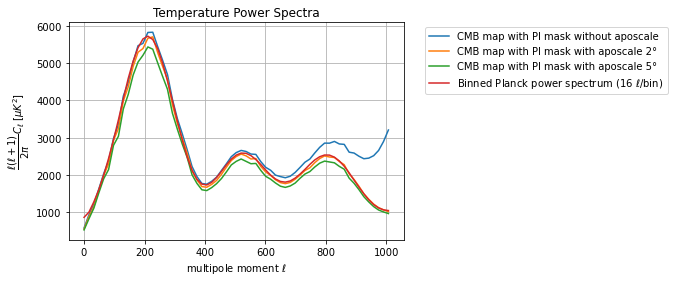

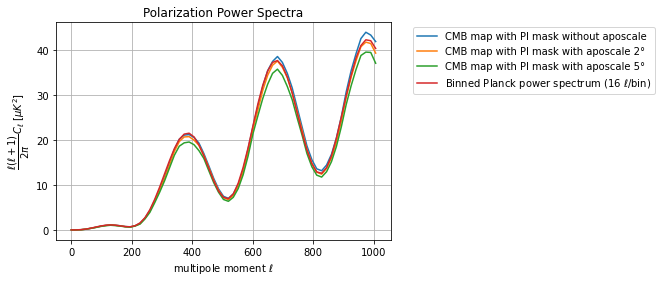

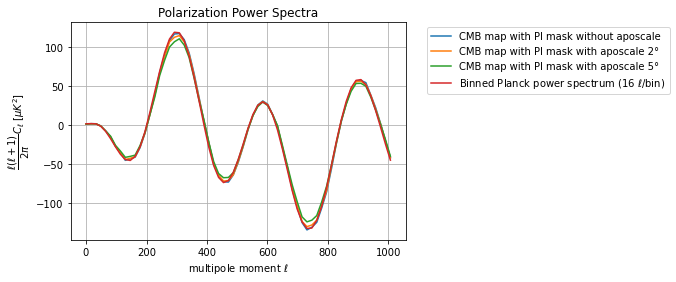

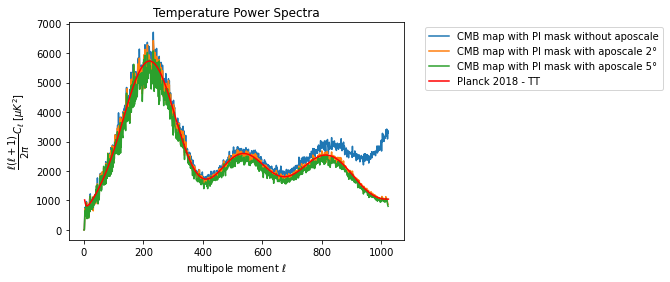

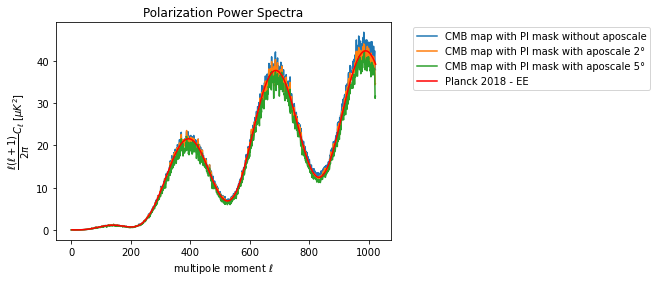

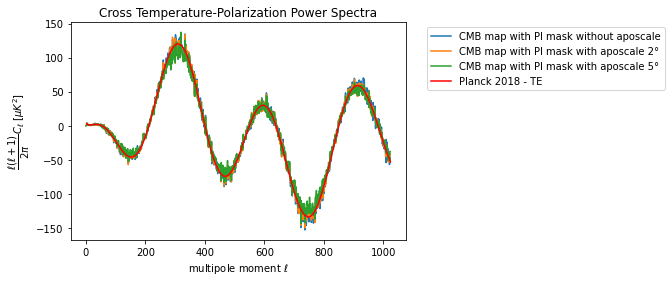

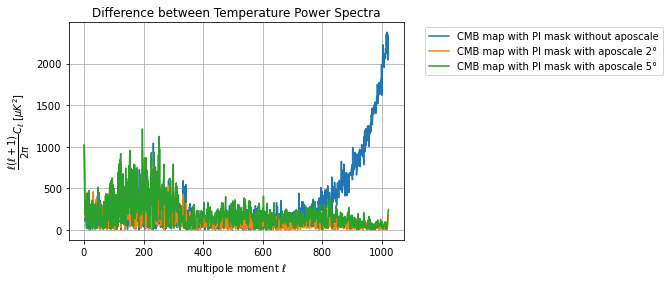

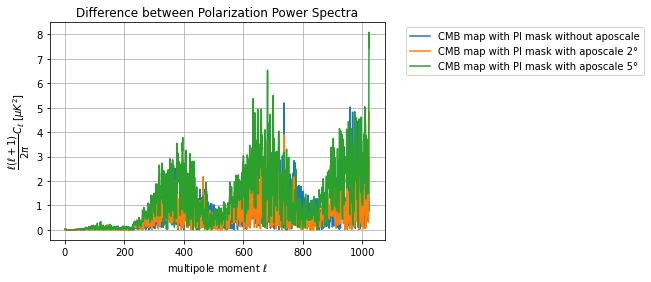

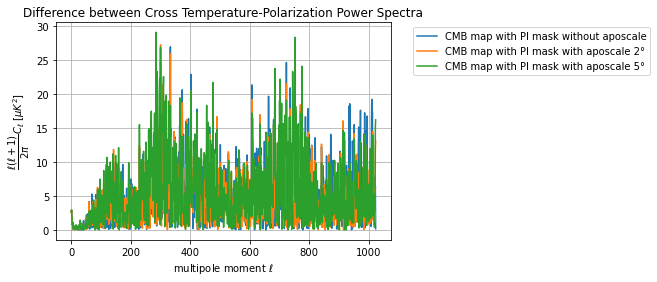

In [34]:
# plot of the TT power spectra
plt.plot(x_new,bin_means_Pl[0][0], label='CMB map with Pl mask without aposcale')
plt.plot(x_new,bin_means_Pl_apo2[0][0], label='CMB map with Pl mask with aposcale 2°')
plt.plot(x_new,bin_means_Pl_apo5[0][0], label='CMB map with Pl mask with aposcale 5°')
plt.plot(x_new,bin_PLA_PS[0][1], label='Binned Planck power spectrum (%s $\ell$/bin)' %bin_size)
plt.title("Temperature Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the EE power spectra
plt.plot(x_new,bin_means_Pl[0][1], label='CMB map with Pl mask without aposcale')
plt.plot(x_new,bin_means_Pl_apo2[0][1], label='CMB map with Pl mask with aposcale 2°')
plt.plot(x_new,bin_means_Pl_apo5[0][1], label='CMB map with Pl mask with aposcale 5°')
plt.plot(x_new,bin_PLA_PS[0][3], label='Binned Planck power spectrum (%s $\ell$/bin)' %bin_size)
plt.title("Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the TE power spectra
plt.plot(x_new,bin_means_Pl[0][3], label='CMB map with Pl mask without aposcale')
plt.plot(x_new,bin_means_Pl_apo2[0][3], label='CMB map with Pl mask with aposcale 2°')
plt.plot(x_new,bin_means_Pl_apo5[0][3], label='CMB map with Pl mask with aposcale 5°')
plt.plot(x_new,bin_PLA_PS[0][2], label='Binned Planck power spectrum (%s $\ell$/bin)' %bin_size)
plt.title("Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

#############################################################################################

# plot of the TT power spectra
plt.plot(Dl_Pl[0][:], label='CMB map with Pl mask without aposcale')
plt.plot(Dl_Pl_apo2[0][:], label='CMB map with Pl mask with aposcale 2°')
plt.plot(Dl_Pl_apo5[0][:], label='CMB map with Pl mask with aposcale 5°')
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,1], color='r', linestyle='-', label='Planck 2018 - TT')
plt.title('Temperature Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

# plot of the EE power spectra
plt.plot(Dl_Pl[1][:], label='CMB map with Pl mask without aposcale')
plt.plot(Dl_Pl_apo2[1][:], label='CMB map with Pl mask with aposcale 2°')
plt.plot(Dl_Pl_apo5[1][:], label='CMB map with Pl mask with aposcale 5°')
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,3], color='r', linestyle='-', label='Planck 2018 - EE')
plt.title('Polarization Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

# plot of the TE power spectra
plt.plot(Dl_Pl[3][:], label='CMB map with Pl mask without aposcale')
plt.plot(Dl_Pl_apo2[3][:], label='CMB map with Pl mask with aposcale 2°')
plt.plot(Dl_Pl_apo5[3][:], label='CMB map with Pl mask with aposcale 5°')
plt.plot(PLA_PS[:lmax,0],PLA_PS[:lmax,2], color='r', linestyle='-', label='Planck 2018 - TE')
plt.title('Cross Temperature-Polarization Power Spectra')
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.show()

#############################################################################################

# plot of the TT power spectra
plt.plot(ell,y_subtraction_Pl[0][0], label='CMB map with Pl mask without aposcale')
plt.plot(ell,y_subtraction_Pl[1][0], label='CMB map with Pl mask with aposcale 2°')
plt.plot(ell,y_subtraction_Pl[2][0], label='CMB map with Pl mask with aposcale 5°')
plt.title("Difference between Temperature Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the EE power spectra
plt.plot(ell,y_subtraction_Pl[0][1], label='CMB map with Pl mask without aposcale')
plt.plot(ell,y_subtraction_Pl[1][1], label='CMB map with Pl mask with aposcale 2°')
plt.plot(ell,y_subtraction_Pl[2][1], label='CMB map with Pl mask with aposcale 5°')
plt.title("Difference between Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()

# plot of the TE power spectra
plt.plot(ell,y_subtraction_Pl[0][2], label='CMB map with Pl mask without aposcale')
plt.plot(ell,y_subtraction_Pl[1][2], label='CMB map with Pl mask with aposcale 2°')
plt.plot(ell,y_subtraction_Pl[2][2], label='CMB map with Pl mask with aposcale 5°')
plt.title("Difference between Cross Temperature-Polarization Power Spectra")
plt.xlabel('multipole moment $\ell$')
plt.ylabel("$\dfrac{\ell(\ell+1)}{2\pi} C_\ell~[\mu K^2]$")
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
plt.grid()
plt.show()